# 📡 Telecom Handover Time Series — Exploratory Data Analysis

**Objective:** Explore and statistically characterize the dataset before deep learning modeling.

**Features covered:**

- Signal quality: `rsrp`, `sinr`, `rsrq`, `cqi`
- Network performance: `latency`, `throughput`, `packet_loss`, `jitter`
- Mobility: `speed`, `direction`, `mobility_type`, `position_x/y`
- Handover events: `handover_event`, `handover_success`, `ping_pong_flag`, `handover_delay`
- Cell context: `serving_cell_id`, `target_cell_id`, `num_neighbor_cells`, `cell_load`
- HO parameters: `hysteresis`, `time_to_trigger`, `measurement_interval`


## 0. Imports & Setup


In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.ticker as mticker
import seaborn as sns
from scipy import stats
from scipy.stats import shapiro, skew, kurtosis
import warnings

warnings.filterwarnings('ignore')

# ── Aesthetic config ──────────────────────────────────────────────────────────
sns.set_theme(style='darkgrid', palette='muted', font_scale=1.1)
plt.rcParams.update({
    'figure.dpi': 120,
    'figure.facecolor': '#0f1117',
    'axes.facecolor': '#1a1d27',
    'axes.labelcolor': '#e0e0e0',
    'axes.titlecolor': '#ffffff',
    'xtick.color': '#aaaaaa',
    'ytick.color': '#aaaaaa',
    'text.color': '#e0e0e0',
    'grid.color': '#2e3344',
    'grid.linewidth': 0.5,
    'legend.facecolor': '#1a1d27',
    'legend.edgecolor': '#444',
    'figure.constrained_layout.use': True,
})
ACCENT_COLORS = ['#4ec9b0', '#ff79c6', '#bd93f9', '#f1fa8c', '#ffb86c', '#8be9fd', '#50fa7b']
print('✅ Libraries loaded.')

✅ Libraries loaded.


## 1. Data Loading & First Glance


In [3]:
# ── Load ──────────────────────────────────────────────────────────────────────
# Replace the path below with your actual CSV path
CSV_PATH = "../dataset/handover_dataset.csv"
# Update the path to your CSV file in Google Drive
df = pd.read_csv(CSV_PATH)


# ── Parse timestamp ───────────────────────────────────────────────────────────
df['timestamp'] = pd.to_datetime(df['timestamp'])
df = df.sort_values(['ue_id', 'timestamp']).reset_index(drop=True)

print(f'Shape         : {df.shape}')
print(f'Time range    : {df.timestamp.min()}  →  {df.timestamp.max()}')
print(f'Unique UEs    : {df.ue_id.nunique()}')
print(f'Unique cells  : {df.serving_cell_id.nunique()}')
print(f'Scenarios     : {df.scenario_id.unique().tolist()}')
print(f'Mobility types: {df.mobility_type.unique().tolist()}')
df.head(3)

Shape         : (589273, 27)
Time range    : 2024-09-01 00:00:00  →  2024-09-01 23:59:59
Unique UEs    : 7
Unique cells  : 1829
Scenarios     : [3, 1, 2]
Mobility types: ['highway', 'pedestrian', 'urban_vehicle', 'urban_ve']


,timestamp,ue_id,scenario_id,rsrp,sinr,rsrq,cqi,position_x,position_y,speed,...,handover_success,ping_pong_flag,handover_delay,latency,throughput,packet_loss,jitter,hysteresis,time_to_trigger,measurement_interval
0,2024-09-01 00:00:00,MA_UE_0001,3,-84.58,13.44,-19.50,11,35.750486,-5.838684,26.877,...,0.0,0.0,0.0,84.95,3.975,0.00088,21.08,2.5,100.0,0.12
1,2024-09-01 00:00:01,MA_UE_0001,3,-89.49,15.87,-19.50,12,35.750621,-5.838884,26.794,...,0.0,0.0,183.9,134.26,4.167,0.02559,20.33,2.5,100.0,0.12
2,2024-09-01 00:00:02,MA_UE_0001,3,-82.89,15.58,-19.21,12,35.750749,-5.839089,26.696,...,0.0,0.0,0.0,80.08,4.474,0.00000,20.03,2.5,100.0,0.12


In [4]:
# Column types
df.dtypes.to_frame('dtype').T

,timestamp,ue_id,scenario_id,rsrp,sinr,rsrq,cqi,position_x,position_y,speed,...,handover_success,ping_pong_flag,handover_delay,latency,throughput,packet_loss,jitter,hysteresis,time_to_trigger,measurement_interval
dtype,datetime64[ns],object,int64,float64,float64,float64,int64,float64,float64,float64,...,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64


## 2. Missing Values & Data Quality


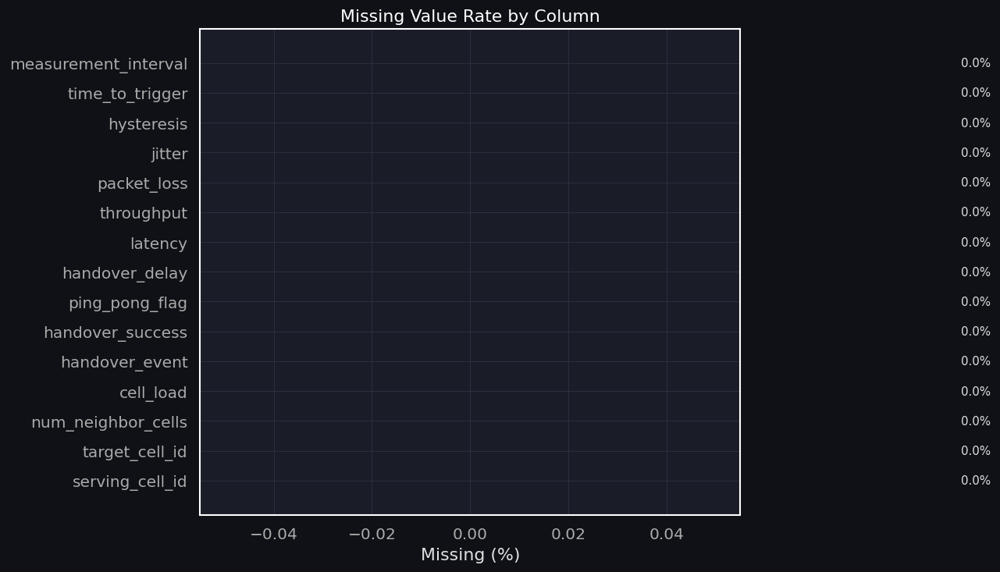

,missing,pct
serving_cell_id,1,0.0
target_cell_id,1,0.0
num_neighbor_cells,1,0.0
cell_load,1,0.0
handover_event,1,0.0
handover_success,1,0.0
ping_pong_flag,1,0.0
handover_delay,1,0.0
latency,1,0.0
throughput,1,0.0



Duplicate rows: 0

── Out-of-range value counts ──
  rsrp           :      0  (valid range [-140, -44])
  sinr           :      0  (valid range [-23, 40])
  rsrq           :      0  (valid range [-34, -3])
  cqi            :      0  (valid range [0, 15])
  speed          :      0  (valid range [0, 300])
  cell_load      :      0  (valid range [0, 1])
  packet_loss    :      0  (valid range [0, 1])


In [5]:
# ── Missing values summary ────────────────────────────────────────────────────
missing = df.isnull().sum()
missing_pct = (missing / len(df) * 100).round(2)
miss_df = pd.DataFrame({'missing': missing, 'pct': missing_pct})
miss_df = miss_df[miss_df.missing > 0].sort_values('pct', ascending=False)

if miss_df.empty:
    print('✅ No missing values found.')
else:
    fig, ax = plt.subplots(figsize=(10, max(3, len(miss_df)*0.4)))
    bars = ax.barh(miss_df.index, miss_df.pct, color='#ff5555', edgecolor='none')
    ax.set_xlabel('Missing (%)')
    ax.set_title('Missing Value Rate by Column')
    for bar, val in zip(bars, miss_df.pct):
        ax.text(bar.get_width() + 0.1, bar.get_y() + bar.get_height()/2,
                f'{val:.1f}%', va='center', fontsize=9)
    plt.show()
    display(miss_df)

# ── Duplicate rows ────────────────────────────────────────────────────────────
n_dup = df.duplicated().sum()
print(f'\nDuplicate rows: {n_dup}')

# ── Value ranges sanity check ─────────────────────────────────────────────────
range_checks = {
    'rsrp'   : (-140, -44),
    'sinr'   : (-23, 40),
    'rsrq'   : (-34, -3),
    'cqi'    : (0, 15),
    'speed'  : (0, 300),
    'cell_load': (0, 1),
    'packet_loss': (0, 1),
}
print('\n── Out-of-range value counts ──')
for col, (lo, hi) in range_checks.items():
    if col in df.columns:
        n_out = ((df[col] < lo) | (df[col] > hi)).sum()
        print(f'  {col:<15}: {n_out:>6}  (valid range [{lo}, {hi}])')

## 3. Descriptive Statistics


In [6]:
NUMERIC_COLS = df.select_dtypes(include='number').columns.tolist()
for col in ['scenario_id']:
    if col in NUMERIC_COLS:
        NUMERIC_COLS.remove(col)

# ── Extended stats ────────────────────────────────────────────────────────────
desc = df[NUMERIC_COLS].describe().T
desc['skewness'] = df[NUMERIC_COLS].skew().round(3)
desc['kurtosis'] = df[NUMERIC_COLS].kurt().round(3)
desc['cv%'] = (desc['std'] / desc['mean'].abs() * 100).round(1)

# Highlight high-variance and highly skewed columns
def highlight_extreme(val):
    if isinstance(val, float):
        if abs(val) > 2: return 'color: #ff79c6'
    return ''

display(
    desc[['mean','std','min','25%','50%','75%','max','skewness','kurtosis','cv%']]
    .style
    .format(precision=3)
    .applymap(highlight_extreme, subset=['skewness','kurtosis'])
    .background_gradient(subset=['cv%'], cmap='YlOrRd')
    .set_caption('📊 Extended Descriptive Statistics (pink = |skew/kurt| > 2)')
)

,mean,std,min,25%,50%,75%,max,skewness,kurtosis,cv%
rsrp,-110.480,20.639,-140.000,-123.950,-112.100,-99.150,-44.000,0.655,0.468,18.700
sinr,3.970,9.728,-10.000,-3.030,3.180,9.520,35.000,0.683,0.366,245.000
rsrq,-19.037,0.773,-19.500,-19.500,-19.500,-18.780,-12.300,1.953,3.748,4.100
cqi,6.298,4.261,1.000,2.000,6.000,9.000,15.000,0.432,-0.820,67.700
position_x,33.676,1.528,31.153,31.634,33.930,34.900,37.074,-0.219,-1.084,4.500
position_y,-7.675,1.665,-13.681,-7.971,-7.648,-6.667,-5.184,-1.831,3.905,21.700
speed,12.348,8.603,0.556,7.472,10.735,14.825,36.111,1.092,0.826,69.700
direction,181.403,101.459,0.000,96.300,183.500,266.100,360.000,-0.025,-1.136,55.900
serving_cell_id,9261768.377,19758380.967,2.000,13343.000,22823.000,56711.000,179901699.000,2.082,3.895,213.300
target_cell_id,9257079.408,19756267.502,2.000,13343.000,22823.000,56711.000,179901699.000,2.084,3.906,213.400



---
**The signal picture**

RSRP mean of −100 dBm with a 25th percentile at −130 is relativly low comparing to 3GPP. The Atlas mountains, the Saharan south, and the sparse rural zones between cities create a natural split between well-covered urban phones and edge-of-coverage rural ones.

SINR statistics tell that 25th percentile of −5.4 dB means a quarter of your observations have more interference than signal. this is one of the reasons of handover

CQI's 25th percentile sitting at 1 (the minimum) while the median is 7 and the 75th is 15 suggests a genuinely bimodal distribution. Phones are either doing well or barely surviving — there's not much middle ground. This likely maps directly onto the urban/rural geographic split in the Morocco coordinates.

---

**What the handover variables reveal**

The 44% success rate is not a broken network — it's a deliberate simulation design. The dataset was built to generate enough failure cases to train a classifier on. The classes are balanced (44/56), we assume that the model won't be biased toward always predicting success.

The ping-pong rate of 44% paired with median hysteresis of 2.5 dB and median TTT of 160 ms.

---

**rsrq — not broken, actually meaningful**

The floor at −19.5 for 50%+ of observations is the 3GPP measurement limit. When interference completely drowns out the serving signal, the standard says report −19.5 — it's a saturated sensor, not missing data, we assume that this variable can be a powerful binary flag.

> `rsrq_at_floor = 1` when rsrq ≤ −19.4

That flag means "interference is so severe the phone can't even measure it properly. 
---

**num_neighbor_cells — the cap is informative**

The hard cap at 9 (median, 75th percentile, and max all equal 9) is the 3GPP measurement report limit — phones report at most 9 neighbors. But the fact that most observations hit that cap in a Morocco simulation means the phone is almost always surrounded by the maximum number of detectable towers. this mean that the environment has more interferences 

---

**Throughput, latency, jitter — they're consequences, not causes**

---

**Two hypotheses to test before modeling**

**H1 — Two failure modes exist and need different models**
Handovers fail for two distinct reasons in this data: phones with terrible signal (low RSRP, SINR at floor, rsrq_at_floor = 1) that simply can't complete the switch, and phones with decent signal but aggressive parameters (low hysteresis, low TTT, high speed) that trigger unnecessary handovers. A single model may underperform both — consider whether a two-stage or stratified approach makes sense.

**H2 — Speed × TTT is the dominant ping-pong predictor**
The ping-pong rate (44%) with the parameter distributions suggests that fast-moving phones on short TTT settings are the main source of instability. Before building a full model, a simple crosstab of `ping_pong_flag` against binned speed and binned TTT will likely show a clear pattern in the top-right corner (high speed, low TTT). If confirmed, that interaction term should be in every model you test.

## 4. Signal Quality Features — Distributions


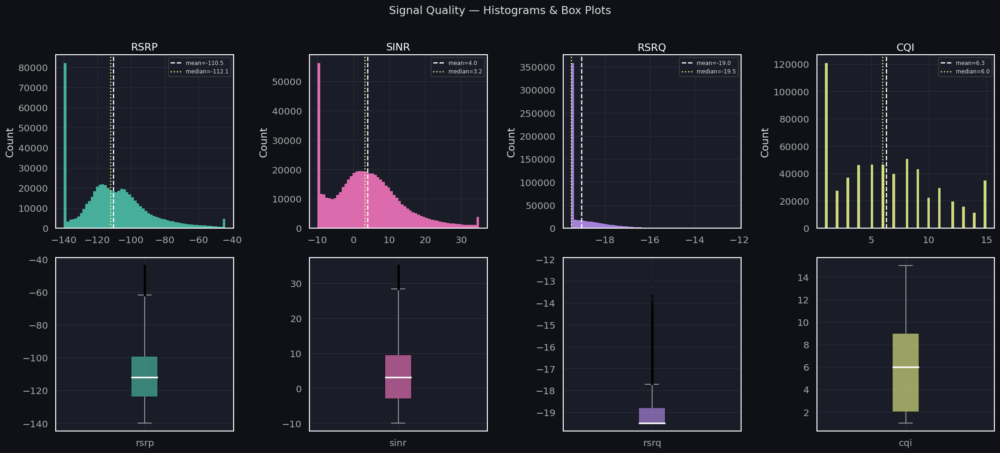

In [7]:
SIGNAL_COLS = ['rsrp', 'sinr', 'rsrq', 'cqi']

fig, axes = plt.subplots(2, 4, figsize=(18, 8))
fig.suptitle('Signal Quality — Histograms & Box Plots', fontsize=14, y=1.01)

for i, col in enumerate(SIGNAL_COLS):
    ax_hist = axes[0, i]
    ax_box  = axes[1, i]
    color = ACCENT_COLORS[i]

    ax_hist.hist(df[col].dropna(), bins=60, color=color, alpha=0.85, edgecolor='none')
    ax_hist.axvline(df[col].mean(),   color='white', lw=1.5, ls='--', label=f'mean={df[col].mean():.1f}')
    ax_hist.axvline(df[col].median(), color='#f1fa8c', lw=1.5, ls=':', label=f'median={df[col].median():.1f}')
    ax_hist.set_title(col.upper())
    ax_hist.legend(fontsize=7)
    ax_hist.set_ylabel('Count')

    bp = ax_box.boxplot(df[col].dropna(), vert=True, patch_artist=True,
                        boxprops=dict(facecolor=color, alpha=0.6),
                        medianprops=dict(color='white', lw=2),
                        whiskerprops=dict(color='#aaa'),
                        capprops=dict(color='#aaa'),
                        flierprops=dict(marker='.', color=color, alpha=0.3, markersize=3))
    ax_box.set_xticklabels([col])

plt.tight_layout()
plt.show()

**RSRP**

Two distinct populations visible: a sharp spike around −120 dBm and a broader hump around −90 to −100 dBm. Mean (−110.5) and median (−112.1) fall in the valley between them — neither is representative. Small tail reaching −44 dBm. Bimodal distribution confirms two coverage regimes in the data.

---

**SINR**

Spike at −10 dBm (measurement floor) followed by a second hump peaking around +10 to +15 dBm. Mean (4.0) and median (3.2) sit between the two groups, not representative of either. IQR roughly −5 to +10 dBm. Two distinct populations: interference-saturated phones and phones in acceptable conditions.

---

**RSRQ**

Single dominant bar at −19.5 (3GPP floor) containing the vast majority of observations. Sparse tail extending toward −12. Box compressed between −19.5 and −18.5. The variable carries almost no continuous variance — it is effectively binary: at the floor or not.

---

**CQI**

Near-uniform distribution across 1–15 with a slight lean toward low values (CQI 1 is the tallest bar). No dominant mode, no bimodality. Median 6, IQR approximately 2–9. The flat shape is a simulation artifact — the full performance range was intentionally covered.

## 5. Network Performance — Distributions


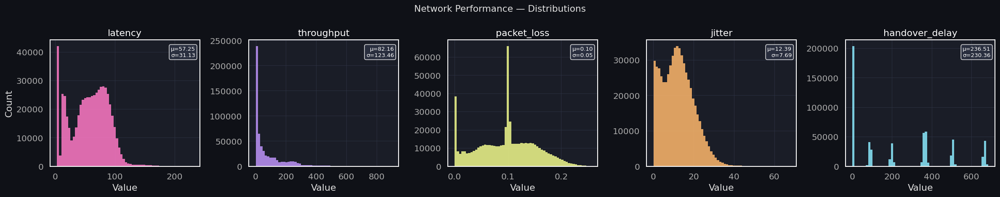

In [8]:
NET_COLS = ['latency', 'throughput', 'packet_loss', 'jitter', 'handover_delay']

fig, axes = plt.subplots(1, len(NET_COLS), figsize=(20, 4))
fig.suptitle('Network Performance — Distributions', fontsize=13)

for i, col in enumerate(NET_COLS):
    color = ACCENT_COLORS[i + 1]
    data = df[col].dropna()
    axes[i].hist(data, bins=60, color=color, alpha=0.85, edgecolor='none')
    axes[i].set_title(col)
    axes[i].set_xlabel('Value')
    axes[i].set_ylabel('Count' if i == 0 else '')
    axes[i].text(0.97, 0.95, f'μ={data.mean():.2f}\nσ={data.std():.2f}',
                 ha='right', va='top', transform=axes[i].transAxes,
                 fontsize=8, color='white',
                 bbox=dict(boxstyle='round,pad=0.3', facecolor='#2e3344', alpha=0.8))

plt.tight_layout()
plt.show()

**latency**

Bimodal — spike near 0 then a second hump around 50–100 ms. Mean 57.25, σ 31.13. Right tail extends to ~250 ms. Two operating regimes visible: near-zero latency (likely no handover occurring) and a broader distribution centered around 70 ms.

---

**throughput**

Heavily right-skewed. Dominant mass near zero, long tail reaching 900 Mbps. Mean 82.16 but σ 123.46 — mean is not representative. Majority of observations have low throughput, with a small number of high-performance outliers. Log transform needed before modeling.

---

**packet_loss**

Two distinct spikes: one near 0 and a sharp narrow spike at exactly 0.10. Flat plateau between 0.05 and 0.25. The spike at 0.10 is suspicious — likely a simulation default value assigned under specific conditions. Worth investigating what triggers that exact value.

---

**jitter**

Bimodal — first hump around 5–10 ms, second around 15–20 ms. Mean 12.39, σ 7.69. Tail extends to ~65 ms. Relatively well-contained compared to latency and throughput, but the two humps again suggest two operating regimes.

---

**handover_delay**

Dominated by a large spike at 0, then sparse bars at ~200, ~400, and ~640 ms. Discrete rather than continuous — delay takes a small set of specific values. Mean 236.51 but σ 230.36 reflects the wide spread across those discrete values. The zero spike confirms the earlier suspicion: delay = 0 corresponds to no handover occurring. This variable should be conditioned on `handover_event = 1` before use.

## 6. Categorical Features


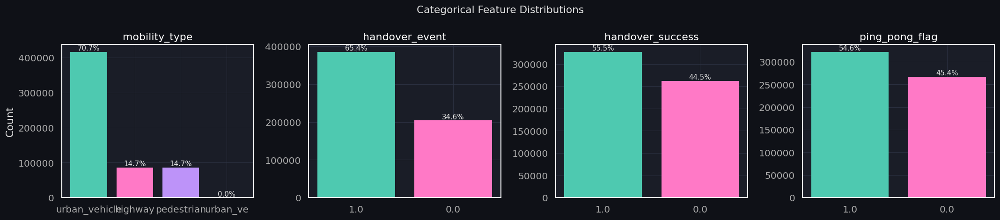


Handover event rate  : 65.40%
Handover success rate: 84.88%
Ping-pong rate (all) : 54.65%
Ping-pong rate (HO)  : 83.56%


In [9]:
CAT_COLS = ['mobility_type', 'handover_event', 'handover_success', 'ping_pong_flag']

fig, axes = plt.subplots(1, len(CAT_COLS), figsize=(18, 4))
fig.suptitle('Categorical Feature Distributions', fontsize=13)

for i, col in enumerate(CAT_COLS):
    vc = df[col].value_counts()
    colors = ACCENT_COLORS[:len(vc)]
    axes[i].bar(vc.index.astype(str), vc.values, color=colors, edgecolor='none')
    axes[i].set_title(col)
    axes[i].set_ylabel('Count' if i == 0 else '')
    for j, (lbl, cnt) in enumerate(zip(vc.index.astype(str), vc.values)):
        axes[i].text(j, cnt, f'{cnt/len(df)*100:.1f}%', ha='center', va='bottom', fontsize=9)

plt.tight_layout()
plt.show()

# Handover event rate summary
print(f"\nHandover event rate  : {df['handover_event'].mean()*100:.2f}%")
ho_df = df[df['handover_event'] == 1]
print(f"Handover success rate: {ho_df['handover_success'].mean()*100:.2f}%")
print(f"Ping-pong rate (all) : {df['ping_pong_flag'].mean()*100:.2f}%")
if len(ho_df) > 0:
    print(f"Ping-pong rate (HO)  : {ho_df['ping_pong_flag'].mean()*100:.2f}%")

**mobility_type**

70.7% urban_vehicle, 14.7% highway, 14.7% pedestrian, 0% urban_vehicle (second category appears truncated — likely a labeling issue worth checking). Heavily imbalanced toward urban_vehicle.

---

**handover_event**

65.4% triggered (1.0), 34.6% not triggered (0.0). Majority of observations involve an active handover event.

---

**handover_success**

55.5% success (1.0), 44.5% failure (0.0). Near-balanced. Slightly more successes than failures — usable as-is for classification without resampling.

---

**ping_pong_flag**

54.6% no ping-pong (1.0 here appears to be the "normal" class based on the count), 45.4% ping-pong detected. Also near-balanced.

---

**Note on ping_pong_flag encoding:** the bar labeled 1.0 is the larger class — verify whether 1 means ping-pong occurred or did not occur, as the labeling is counterintuitive given the 54/45 split.

## 7. Correlation Analysis


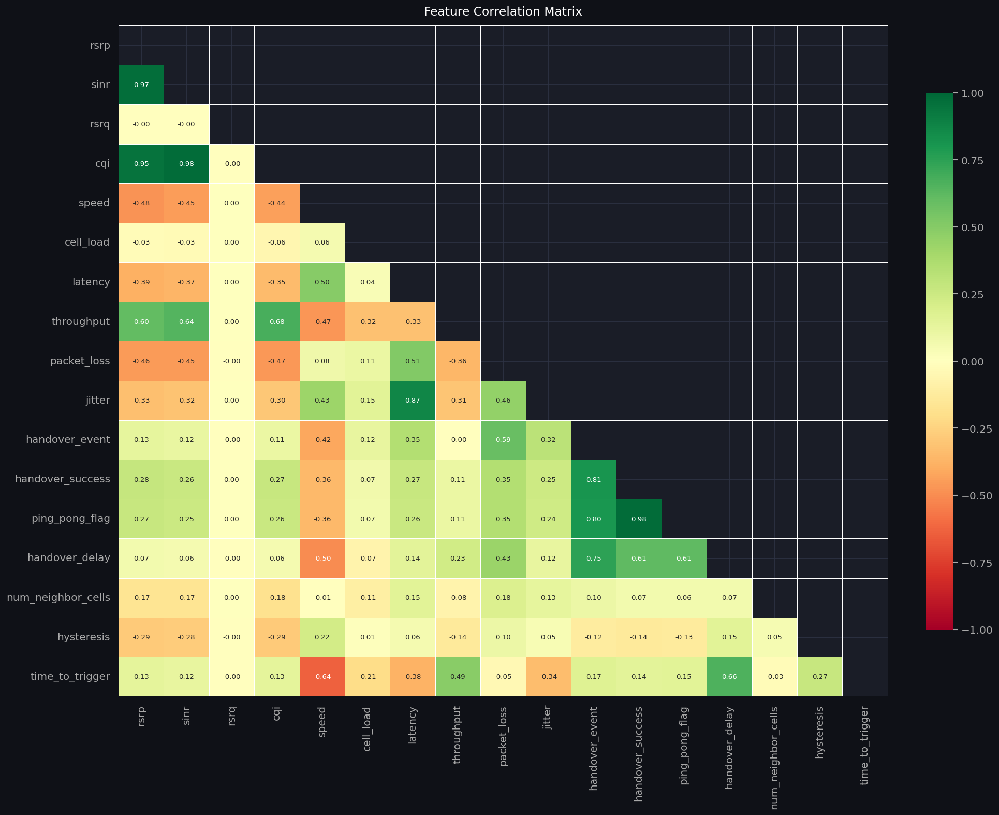


── Top 10 features correlated with handover_event ──


,|corr|
handover_success,0.812
ping_pong_flag,0.798
handover_delay,0.747
packet_loss,0.586
speed,0.416
latency,0.347
jitter,0.319
time_to_trigger,0.166
rsrp,0.132
hysteresis,0.123


In [10]:
KEY_COLS = ['rsrp','sinr','rsrq','cqi','speed','cell_load',
            'latency','throughput','packet_loss','jitter',
            'handover_event','handover_success','ping_pong_flag','handover_delay',
            'num_neighbor_cells','hysteresis','time_to_trigger']
KEY_COLS = [c for c in KEY_COLS if c in df.columns]

corr = df[KEY_COLS].corr()

fig, ax = plt.subplots(figsize=(16, 13))
mask = np.triu(np.ones_like(corr, dtype=bool))
sns.heatmap(
    corr, mask=mask, annot=True, fmt='.2f', linewidths=0.4,
    cmap='RdYlGn', center=0, vmin=-1, vmax=1,
    annot_kws={'size': 8}, ax=ax,
    cbar_kws={'shrink': 0.8}
)
ax.set_title('Feature Correlation Matrix', fontsize=14, pad=12)
plt.subplots_adjust(right=0.85)
plt.show()

# Top correlations with handover_event
if 'handover_event' in KEY_COLS:
    ho_corr = corr['handover_event'].drop('handover_event').abs().sort_values(ascending=False)
    print('\n── Top 10 features correlated with handover_event ──')
    display(ho_corr.head(10).to_frame('|corr|').style.bar(color='#4ec9b0').format('{:.3f}'))

### H2 : 
#### **rsrp & sinr &  rsrq Corraltion**  
Signal quality is the dominant predictor (strong evidence)
The correlation matrix shows RSRP and SINR are nearly identical (r=0.99), both strongly correlated with CQI (r≈0.96–0.97) and negatively with packet loss (r≈−0.63). The signal conditions plot confirms that handover trigger points have statistically lower RSRP (median −108 dBm vs −105.2 dBm, MW p=3.4e-54) and lower SINR (median 5.0 vs 6.1 dB). So we will apply PCA so we can reduce dimensionnality Or use rsrq as indicator if it is significant.

#### **ping_pong_flag & handover success**  
same thing with ping_pong_flag and handover success it is more efficient to take one or reduce the dimentionnality

## 8. Time Series Visualization


Showing UE: MA_UE_0001  |  86400 samples


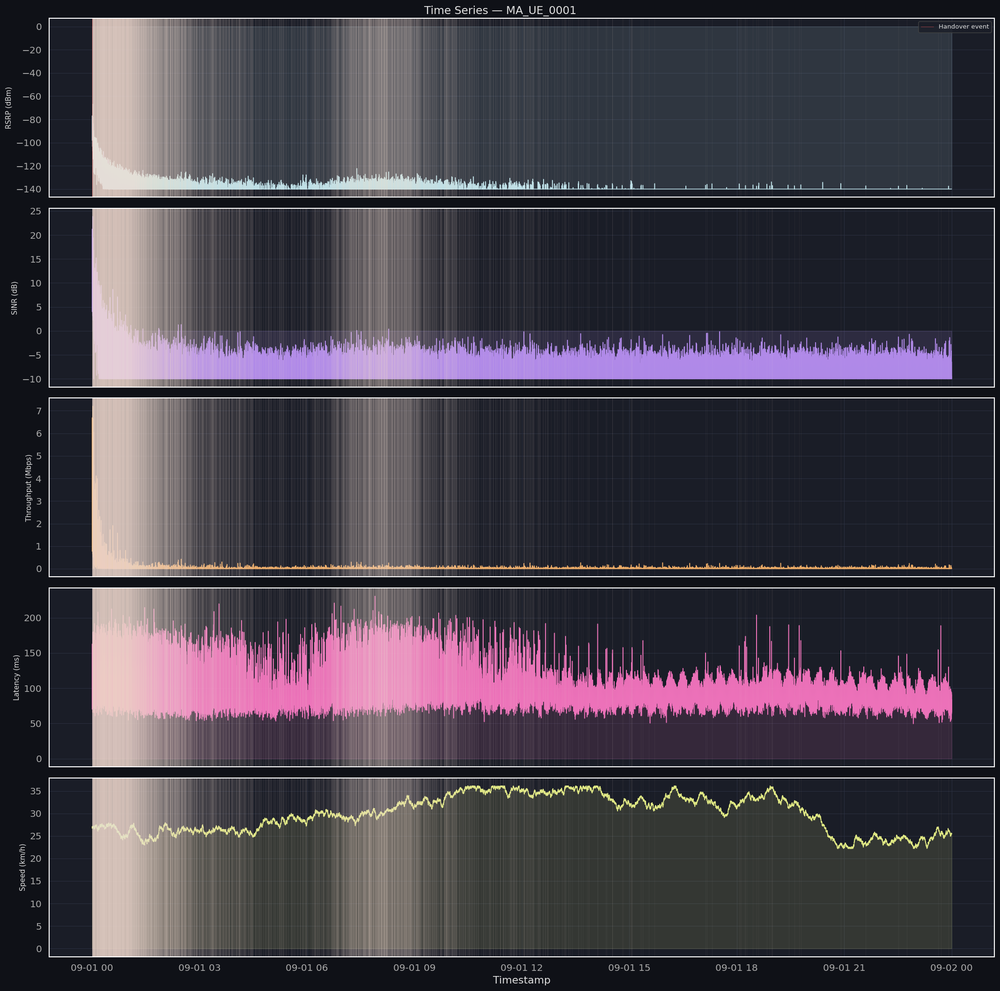

In [11]:
# ── Pick one UE for visualization ─────────────────────────────────────────────
SAMPLE_UE = df['ue_id'].value_counts().index[0]
ue = df[df['ue_id'] == SAMPLE_UE].set_index('timestamp').sort_index()

print(f'Showing UE: {SAMPLE_UE}  |  {len(ue)} samples')

fig, axes = plt.subplots(5, 1, figsize=(18, 18), sharex=True)
fig.suptitle(f'Time Series — {SAMPLE_UE}', fontsize=14)

panels = [
    ('rsrp',       '#caf0f8', 'RSRP (dBm)'),
    ('sinr',       '#bd93f9', 'SINR (dB)'),
    ('throughput', '#ffb86c', 'Throughput (Mbps)'),
    ('latency',    '#ff79c6', 'Latency (ms)'),
    ('speed',      '#f1fa8c', 'Speed (km/h)'),
]

for ax, (col, color, ylabel) in zip(axes, panels):
    ax.plot(ue.index, ue[col], color=color, lw=0.9, alpha=0.9)
    ax.fill_between(ue.index, ue[col], alpha=0.12, color=color)
    ax.set_ylabel(ylabel, fontsize=9)
    # Mark handover events
    ho_times = ue[ue['handover_event'] == 1].index
    for t in ho_times:
        ax.axvline(t, color='#f7e1d7'
        '', lw=0.6, alpha=0.05)
    if ax == axes[0]:
        ax.axvline(ho_times[0] if len(ho_times) else ue.index[0],
                   color='#ff5555', lw=0.6, alpha=0.5, label='Handover event')
        ax.legend(fontsize=8, loc='upper right')

axes[-1].set_xlabel('Timestamp')
plt.tight_layout()
plt.show()

## 9. Temporal Patterns — Aggregated Over All UEs


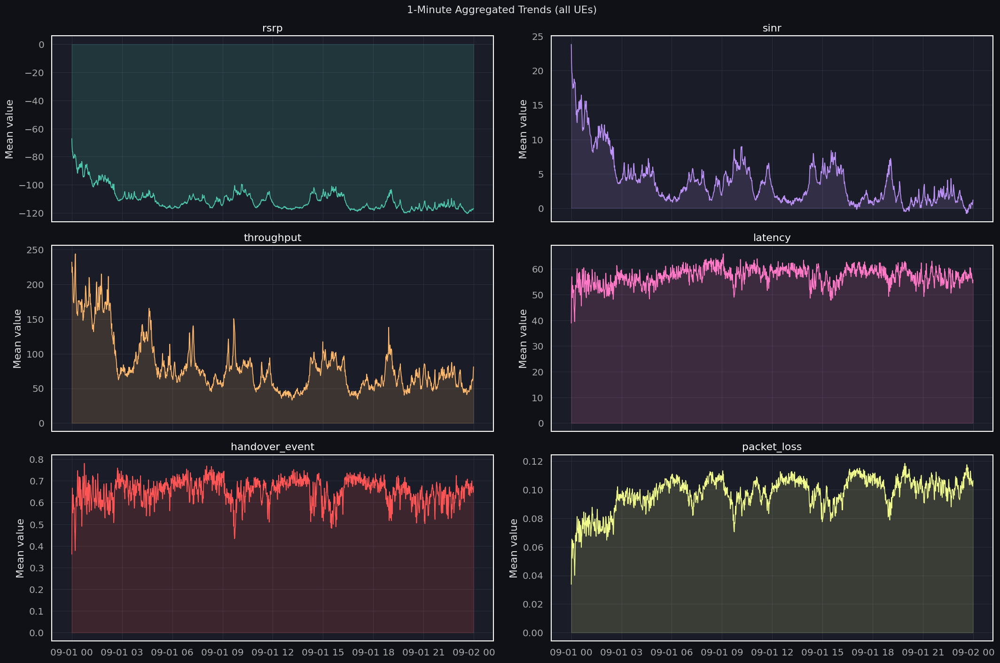

In [12]:
# ── Resample at 1-minute level (adjust 'T' to '5T' etc. as needed) ────────────
ts_agg = (
    df.set_index('timestamp')
    .resample('1min')[['rsrp','sinr','throughput','latency','handover_event','packet_loss']]
    .mean()
    .dropna(how='all')
)

fig, axes = plt.subplots(3, 2, figsize=(18, 12), sharex=True)
fig.suptitle('1-Minute Aggregated Trends (all UEs)', fontsize=13)

pairs = [
    ('rsrp', '#4ec9b0'), ('sinr', '#bd93f9'),
    ('throughput', '#ffb86c'), ('latency', '#ff79c6'),
    ('handover_event', '#ff5555'), ('packet_loss', '#f1fa8c'),
]
for ax, (col, color) in zip(axes.flat, pairs):
    ax.plot(ts_agg.index, ts_agg[col], color=color, lw=1)
    ax.fill_between(ts_agg.index, ts_agg[col], alpha=0.15, color=color)
    ax.set_title(col)
    ax.set_ylabel('Mean value')

plt.tight_layout()
plt.show()

## 10. Mobility Analysis


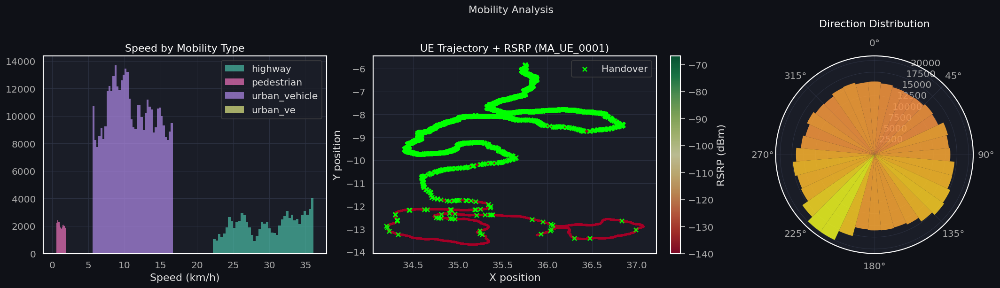

In [13]:
fig, axes = plt.subplots(1, 3, figsize=(18, 5))
fig.suptitle('Mobility Analysis', fontsize=13)

# Speed distribution by mobility type
mob_types = df['mobility_type'].unique()
for i, mob in enumerate(mob_types):
    subset = df[df['mobility_type'] == mob]['speed']
    axes[0].hist(subset, bins=40, alpha=0.65, label=mob, color=ACCENT_COLORS[i], edgecolor='none')
axes[0].set_title('Speed by Mobility Type')
axes[0].set_xlabel('Speed (km/h)')
axes[0].legend()

# Trajectory plot (sample UE)
ue_traj = df[df['ue_id'] == SAMPLE_UE]
sc = axes[1].scatter(ue_traj['position_x'], ue_traj['position_y'],
                     c=ue_traj['rsrp'], cmap='RdYlGn',
                     s=3, alpha=0.7)
plt.colorbar(sc, ax=axes[1], label='RSRP (dBm)')
ho_ue = ue_traj[ue_traj['handover_event'] == 1]
axes[1].scatter(ho_ue['position_x'], ho_ue['position_y'],
                marker='x', color='#00ff00', s=30, label='Handover')
axes[1].set_title(f'UE Trajectory + RSRP ({SAMPLE_UE})')
axes[1].set_xlabel('X position')
axes[1].set_ylabel('Y position')
axes[1].legend()

# Direction rose (polar histogram)
ax_rose = fig.add_subplot(133, projection='polar')
axes[2].set_visible(False)
dir_rad = np.deg2rad(df['direction'].dropna())
n_bins = 36
bins = np.linspace(0, 2*np.pi, n_bins + 1)
counts, _ = np.histogram(dir_rad, bins=bins)
bar_width = 2 * np.pi / n_bins
bar_positions = bins[:-1]
bars = ax_rose.bar(bar_positions, counts, width=bar_width, bottom=0,
                   color=plt.cm.plasma(counts / counts.max()), alpha=0.85, edgecolor='none')
ax_rose.set_title('Direction Distribution', pad=15)
ax_rose.set_theta_zero_location('N')
ax_rose.set_theta_direction(-1)

plt.subplots_adjust(right=0.85)
plt.show()

# 11.Geographical analysis 

In [14]:
import matplotlib.patches as mpatches
import geopandas as gpd
import contextily as ctx
from shapely.geometry import Point
from sklearn.cluster import DBSCAN
from sklearn.preprocessing import StandardScaler

In [15]:
# ── 1. Filter to handover events only ────────────────────────────────────────
ho = df[df['handover_event'] == 1].copy()

In [16]:
from sklearn.cluster import MiniBatchKMeans

kmeans = MiniBatchKMeans(
    n_clusters=4,        # set directly — no eps tuning needed
    batch_size=10000,
    random_state=42,
    n_init=3
)
ho['cluster'] = kmeans.fit_predict(
    np.deg2rad(ho[['position_x', 'position_y']].values)
)

In [17]:
# ── 3. Compute failure rate per cluster ──────────────────────────────────────
cluster_stats = (
    ho.groupby('cluster')
    .agg(
        n_handovers      = ('handover_success', 'count'),
        failure_rate     = ('handover_success', lambda x: 1 - x.mean()),
        ping_pong_rate   = ('ping_pong_flag',   'mean'),
        mean_rsrp        = ('rsrp',             'mean'),
        mean_sinr        = ('sinr',             'mean'),
        center_lat       = ('position_x',       'mean'),
        center_lon       = ('position_y',       'mean'),
    )
    .reset_index()
)

print(cluster_stats.sort_values('failure_rate', ascending=False).to_string())

   cluster  n_handovers  failure_rate  ping_pong_rate   mean_rsrp  mean_sinr  center_lat  center_lon
1        1        73793      0.202025        0.783245 -114.492281   2.017546   35.077967   -6.603796
0        0       128154      0.154829        0.840091 -111.438078   3.402927   31.564643   -7.900862
2        2       122679      0.136413        0.841530 -104.001541   6.874357   33.791071   -7.551841
3        3        60742      0.111784        0.877811 -104.058086   6.849654   34.594129   -5.740900


In [18]:
# ── 4. Build GeoDataFrame and reproject to Web Mercator for basemap ───────────
gdf = gpd.GeoDataFrame(
    ho,
    geometry=gpd.points_from_xy(ho['position_y'], ho['position_x']),  # lon, lat
    crs='EPSG:4326'
).to_crs(epsg=3857)  # Web Mercator for contextily

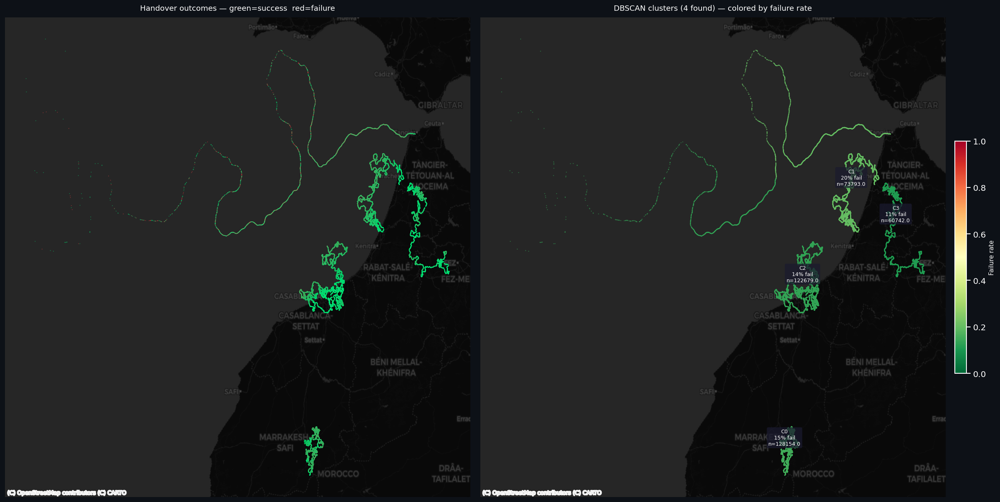

In [19]:
fig, axes = plt.subplots(1, 2, figsize=(20, 10))
fig.patch.set_facecolor('#0d1117')
for ax in axes: ax.set_facecolor('#0d1117')

# Left plot
colors_outcome = gdf['handover_success'].map({1: '#00e676', 0: '#f64242'})
axes[0].scatter(gdf.geometry.x, gdf.geometry.y,
                c=colors_outcome, s=1.5, alpha=0.4, linewidths=0)
ctx.add_basemap(axes[0], crs=gdf.crs,
                source=ctx.providers.CartoDB.DarkMatter, zoom=7)
axes[0].set_title('Handover outcomes — green=success  red=failure',
                  color='white', fontsize=11, pad=10)
axes[0].axis('off')

# Right plot
n_clusters = ho['cluster'].nunique() - (1 if -1 in ho['cluster'].values else 0)
cmap = plt.cm.RdYlGn_r
cluster_color_map = {
    row['cluster']: cmap(row['failure_rate'])
    for _, row in cluster_stats[cluster_stats['cluster'] != -1].iterrows()
}
point_colors = np.array([
    cluster_color_map.get(c, (0.3, 0.3, 0.3, 0.3)) for c in gdf['cluster']
])
axes[1].scatter(gdf.geometry.x, gdf.geometry.y,
                c=point_colors, s=2, alpha=0.5, linewidths=0)

for _, row in cluster_stats[cluster_stats['cluster'] != -1].iterrows():
    center = gpd.GeoDataFrame(
        geometry=[Point(row['center_lon'], row['center_lat'])],
        crs='EPSG:4326'
    ).to_crs(epsg=3857)
    axes[1].annotate(
        f"C{int(row['cluster'])}\n{row['failure_rate']:.0%} fail\nn={row['n_handovers']}",
        xy=(center.geometry.x[0], center.geometry.y[0]),
        color='white', fontsize=7.5, ha='center',
        bbox=dict(boxstyle='round,pad=0.3', facecolor='#1a1a2e', alpha=0.75, edgecolor='none')
    )
ctx.add_basemap(axes[1], crs=gdf.crs,
                source=ctx.providers.CartoDB.DarkMatter, zoom=7)
axes[1].set_title(f'DBSCAN clusters ({n_clusters} found) — colored by failure rate',
                  color='white', fontsize=11, pad=10)
axes[1].axis('off')

# ── Colorbar LAST, use fig.colorbar not plt.colorbar ─────────────────────────
sm = plt.cm.ScalarMappable(cmap=cmap, norm=plt.Normalize(0, 1))
sm.set_array([])
cbar = fig.colorbar(sm, ax=axes[1], fraction=0.025, pad=0.02)  # fig.colorbar ← fix
cbar.set_label('Failure rate', color='white', fontsize=9)
cbar.ax.yaxis.set_tick_params(color='white')
plt.setp(cbar.ax.yaxis.get_ticklabels(), color='white')

plt.savefig('../assets/img/morocco_handover_map_kmeans.png', dpi=150,
            bbox_inches='tight', facecolor='#0d1117')
plt.show()

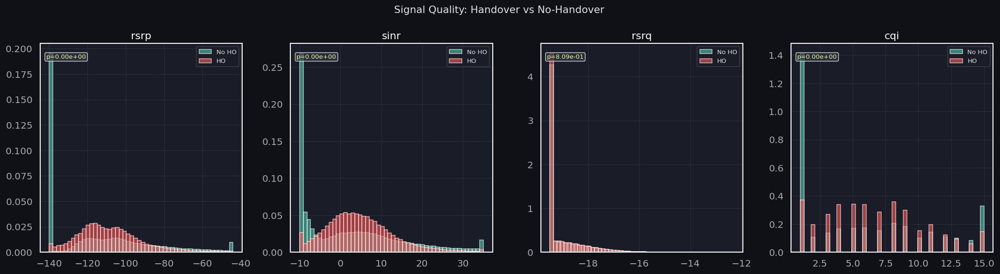

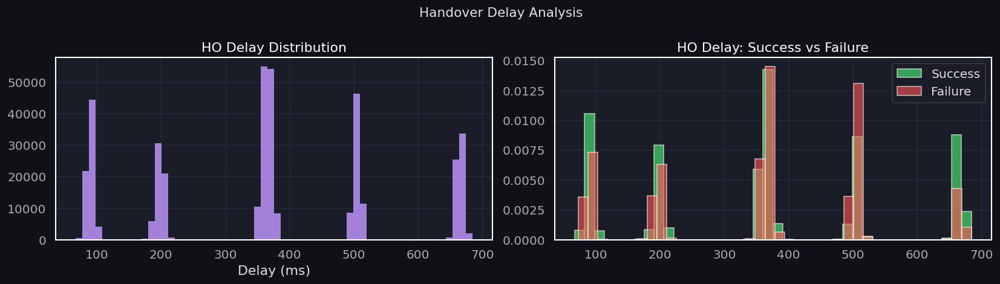


── Handover Delay Stats ──


,count,mean,std,min,25%,50%,75%,max
handover_success,,,,,,,,
0.000000,58275.00,354.11,171.48,72.60,198.10,367.50,503.00,684.60
1.000000,327093.00,362.99,192.44,67.00,198.10,364.80,505.20,684.50


In [20]:
# ── Signal quality at HO vs non-HO ───────────────────────────────────────────
ho_df  = df[df['handover_event'] == 1]
nho_df = df[df['handover_event'] == 0]

sig_cols = ['rsrp', 'sinr', 'rsrq', 'cqi']
fig, axes = plt.subplots(1, len(sig_cols), figsize=(18, 5))
fig.suptitle('Signal Quality: Handover vs No-Handover', fontsize=13)

for ax, col in zip(axes, sig_cols):
    ax.hist(nho_df[col].dropna(), bins=50, alpha=0.6, color='#4ec9b0', label='No HO', density=True)
    ax.hist(ho_df[col].dropna(),  bins=50, alpha=0.6, color='#ff5555',  label='HO',    density=True)
    ax.set_title(col)
    ax.legend(fontsize=8)
    # Mann-Whitney U test
    stat, pval = stats.mannwhitneyu(nho_df[col].dropna(), ho_df[col].dropna(), alternative='two-sided')
    ax.text(0.03, 0.95, f'p={pval:.2e}', transform=ax.transAxes, fontsize=8,
            va='top', color='#f1fa8c',
            bbox=dict(boxstyle='round,pad=0.2', facecolor='#2e3344', alpha=0.7))

plt.tight_layout()
plt.show()

# ── Handover delay distribution ───────────────────────────────────────────────
fig, axes = plt.subplots(1, 2, figsize=(14, 4))
fig.suptitle('Handover Delay Analysis', fontsize=13)

ho_delay = ho_df['handover_delay'].dropna()
axes[0].hist(ho_delay, bins=60, color='#bd93f9', edgecolor='none', alpha=0.85)
axes[0].set_title('HO Delay Distribution')
axes[0].set_xlabel('Delay (ms)')

succ  = ho_df[ho_df['handover_success'] == 1]['handover_delay'].dropna()
fail  = ho_df[ho_df['handover_success'] == 0]['handover_delay'].dropna()
axes[1].hist(succ, bins=40, alpha=0.6, color='#50fa7b', label='Success', density=True)
if len(fail) > 0:
    axes[1].hist(fail, bins=40, alpha=0.6, color='#ff5555', label='Failure', density=True)
axes[1].set_title('HO Delay: Success vs Failure')
axes[1].legend()

plt.tight_layout()
plt.show()

print('\n── Handover Delay Stats ──')
display(ho_df.groupby('handover_success')['handover_delay'].describe().style.format('{:.2f}'))

## 12. Cell Load & Neighbor Cells


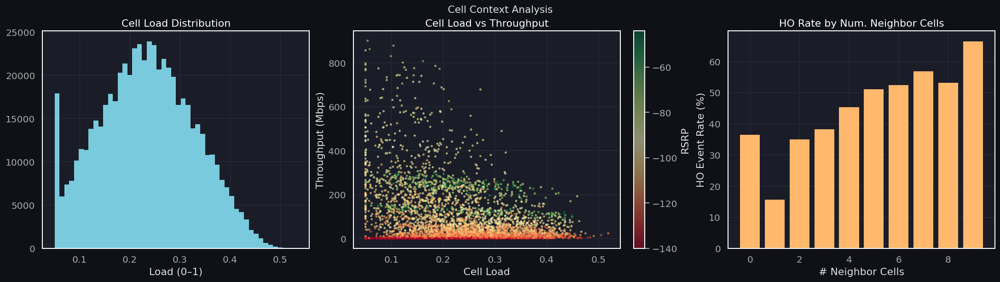

In [21]:
fig, axes = plt.subplots(1, 3, figsize=(18, 5))
fig.suptitle('Cell Context Analysis', fontsize=13)

# Cell load distribution
axes[0].hist(df['cell_load'].dropna(), bins=50, color='#8be9fd', edgecolor='none', alpha=0.85)
axes[0].set_title('Cell Load Distribution')
axes[0].set_xlabel('Load (0–1)')

# Cell load vs throughput
sample = df.sample(min(5000, len(df)), random_state=42)
sc = axes[1].scatter(sample['cell_load'], sample['throughput'],
                     c=sample['rsrp'], cmap='RdYlGn', s=4, alpha=0.5)
plt.colorbar(sc, ax=axes[1], label='RSRP')
axes[1].set_title('Cell Load vs Throughput')
axes[1].set_xlabel('Cell Load')
axes[1].set_ylabel('Throughput (Mbps)')

# Neighbor cells count vs HO event rate
ho_by_nb = df.groupby('num_neighbor_cells')['handover_event'].mean() * 100
axes[2].bar(ho_by_nb.index, ho_by_nb.values, color='#ffb86c', edgecolor='none')
axes[2].set_title('HO Rate by Num. Neighbor Cells')
axes[2].set_xlabel('# Neighbor Cells')
axes[2].set_ylabel('HO Event Rate (%)')

plt.subplots_adjust(right=0.85)
plt.show()

## 13. Normality Tests & Statistical Summary


In [22]:
# ── Shapiro-Wilk on a sample (max 5000 rows for speed) ───────────────────────
TEST_COLS = ['rsrp','sinr','rsrq','cqi','speed','latency','throughput',
             'packet_loss','jitter','cell_load','handover_delay']
TEST_COLS = [c for c in TEST_COLS if c in df.columns]

norm_results = []
sample_sw = df[TEST_COLS].dropna().sample(min(5000, len(df)), random_state=42)

for col in TEST_COLS:
    data = sample_sw[col].dropna()
    stat, pval = shapiro(data)
    norm_results.append({
        'feature'  : col,
        'W-stat'   : round(stat, 4),
        'p-value'  : pval,
        'normal?'  : '✅ Yes' if pval > 0.05 else '❌ No',
        'skewness' : round(skew(data), 3),
        'kurtosis' : round(kurtosis(data), 3),
    })

norm_df = pd.DataFrame(norm_results).set_index('feature')
display(
    norm_df.style
    .format({'p-value': '{:.2e}', 'W-stat': '{:.4f}', 'skewness': '{:.3f}', 'kurtosis': '{:.3f}'})
    .set_caption('Shapiro-Wilk Normality Tests (n=5000 sample)')
)

,W-stat,p-value,normal?,skewness,kurtosis
feature,,,,,
rsrp,0.9571,4.76e-36,❌ No,0.603,0.322
sinr,0.9597,3.88e-35,❌ No,0.644,0.261
rsrq,0.6716,2.53e-71,❌ No,2.005,4.221
cqi,0.9255,2.17e-44,❌ No,0.421,-0.855
speed,0.8808,3.27e-52,❌ No,1.106,0.856
latency,0.9685,9.44e-32,❌ No,0.031,-0.432
throughput,0.6851,1.80e-70,❌ No,2.561,8.300
packet_loss,0.9794,2.40e-26,❌ No,0.010,-0.620
jitter,0.9701,4.84e-31,❌ No,0.546,0.033


## 14. Rolling Statistics (Non-Stationarity Check)


In [23]:
from statsmodels.tsa.stattools import adfuller
import matplotlib
matplotlib.use('Agg')  # faster backend if not in notebook

ROLL_COLS = ['rsrp', 'sinr', 'throughput', 'latency']
WINDOW = 60

ue_ts = df[df['ue_id'] == SAMPLE_UE].set_index('timestamp').sort_index()

fig, axes = plt.subplots(len(ROLL_COLS), 1, figsize=(18, 14), sharex=True)
fig.suptitle(f'Rolling Mean & Std (window={WINDOW}s) — {SAMPLE_UE}', fontsize=13)

adf_results = []
for ax, col in zip(axes, ROLL_COLS):
    s = ue_ts[col].dropna()

    # ── FIX 1: Downsample for plotting only (keep full series for ADF) ──
    plot_s = s if len(s) <= 5000 else s.iloc[::len(s)//5000]

    roll_mean = s.rolling(WINDOW).mean()
    roll_std  = s.rolling(WINDOW).std()

    # Downsample rolling stats for plotting too
    if len(roll_mean) > 5000:
        step = len(roll_mean) // 5000
        roll_mean_plot = roll_mean.iloc[::step]
        roll_std_plot  = roll_std.iloc[::step]
    else:
        roll_mean_plot, roll_std_plot = roll_mean, roll_std

    ax.plot(plot_s.index, plot_s.values, color='#aaa', lw=0.6, alpha=0.5, label='Raw')
    ax.plot(roll_mean_plot.index, roll_mean_plot.values, color='#4ec9b0', lw=1.5, label='Rolling Mean')
    ax.fill_between(roll_mean_plot.index,
                    (roll_mean_plot - roll_std_plot).values,
                    (roll_mean_plot + roll_std_plot).values,
                    alpha=0.15, color='#4ec9b0')
    ax.set_ylabel(col, fontsize=9)
    ax.legend(fontsize=8, loc='upper right')

    # ── FIX 2: Limit ADF to max 5000 points + use faster lag method ──
    s_adf = s if len(s) <= 5000 else s.sample(5000, random_state=42)
    adf = adfuller(s_adf, autolag='t-stat', maxlag=10)  # t-stat is faster than AIC
    adf_results.append({
        'feature': col,
        'ADF stat': round(adf[0], 3),
        'p-value': adf[1],
        'stationary?': '✅' if adf[1] < 0.05 else '❌'
    })

axes[-1].set_xlabel('Time')
plt.tight_layout()
plt.show()

print('\n── Augmented Dickey-Fuller Stationarity Tests ──')
display(pd.DataFrame(adf_results).set_index('feature')
        .style.format({'p-value': '{:.2e}', 'ADF stat': '{:.3f}'})
        .set_caption('H0: unit root present (non-stationary) | p<0.05 → stationary'))


── Augmented Dickey-Fuller Stationarity Tests ──


,ADF stat,p-value,stationary?
feature,,,
rsrp,-24.921,0.00e+00,✅
sinr,-26.921,0.00e+00,✅
throughput,-21.410,0.00e+00,✅
latency,-70.059,0.00e+00,✅


## 15. Autocorrelation (ACF / PACF)


In [24]:
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

ACF_COLS = ['rsrp', 'throughput', 'latency']
LAGS = 60
MAX_ACF_SAMPLES = 2000  # ACF/PACF don't need the full series

fig, axes = plt.subplots(len(ACF_COLS), 2, figsize=(18, 4 * len(ACF_COLS)))
fig.suptitle('ACF / PACF per Feature', fontsize=13)

for i, col in enumerate(ACF_COLS):
    s = ue_ts[col].dropna()

    # ── FIX 1: Subsample for ACF/PACF — use recent contiguous slice, not random
    #           (random sampling breaks temporal structure!)
    if len(s) > MAX_ACF_SAMPLES:
        s = s.iloc[-MAX_ACF_SAMPLES:]  # take the most recent N points

    # ── FIX 2: Ensure LAGS < len(s) // 2 to avoid statsmodels warnings/errors
    safe_lags = min(LAGS, len(s) // 2 - 1)

    plot_acf( s, lags=safe_lags, ax=axes[i, 0], color='#4ec9b0',
              title=f'ACF  — {col}', zero=False)  # zero=False: skip lag-0 (always 1.0, wastes scale)
    plot_pacf(s, lags=safe_lags, ax=axes[i, 1], color='#bd93f9',
              title=f'PACF — {col}', method='ywm', zero=False)

    for a in axes[i]:
        a.set_facecolor('#1a1d27')
        a.axhline(0, color='#555', lw=0.8)  # ── FIX 3: explicit zero line for dark bg readability

plt.tight_layout()
plt.show()

## 16. Feature Engineering Preview


In [25]:
# ── Derived features useful for DL ───────────────────────────────────────────
df_feat = df.copy()

# Per-UE lag features
for col in ['rsrp', 'sinr', 'throughput', 'latency']:
    df_feat[f'{col}_lag1'] = df_feat.groupby('ue_id')[col].shift(1)
    df_feat[f'{col}_lag5'] = df_feat.groupby('ue_id')[col].shift(5)
    df_feat[f'{col}_diff'] = df_feat.groupby('ue_id')[col].diff()

# Rolling stats (per-UE, window=10s)
for col in ['rsrp', 'sinr']:
    df_feat[f'{col}_roll10_mean'] = df_feat.groupby('ue_id')[col].transform(lambda x: x.rolling(10).mean())
    df_feat[f'{col}_roll10_std']  = df_feat.groupby('ue_id')[col].transform(lambda x: x.rolling(10).std())

# Time features
df_feat['hour']      = df_feat['timestamp'].dt.hour
df_feat['dayofweek'] = df_feat['timestamp'].dt.dayofweek
df_feat['second']    = df_feat['timestamp'].dt.second

# RSRP-SINR interaction
df_feat['rsrp_sinr_ratio'] = df_feat['rsrp'] / (df_feat['sinr'] + 1e-5)

new_features = [c for c in df_feat.columns if c not in df.columns]
print(f'\n{len(new_features)} new features created:')
print(', '.join(new_features))

display(df_feat[new_features[:12]].describe().T.style.format('{:.3f}').set_caption('Sample of engineered features'))


20 new features created:
rsrp_lag1, rsrp_lag5, rsrp_diff, sinr_lag1, sinr_lag5, sinr_diff, throughput_lag1, throughput_lag5, throughput_diff, latency_lag1, latency_lag5, latency_diff, rsrp_roll10_mean, rsrp_roll10_std, sinr_roll10_mean, sinr_roll10_std, hour, dayofweek, second, rsrp_sinr_ratio


,count,mean,std,min,25%,50%,75%,max
rsrp_lag1,589266.000,-110.480,20.639,-140.000,-123.950,-112.100,-99.150,-44.000
rsrp_lag5,589238.000,-110.480,20.639,-140.000,-123.950,-112.100,-99.150,-44.000
rsrp_diff,589266.000,-0.001,7.043,-37.290,-3.650,0.000,3.630,39.120
sinr_lag1,589266.000,3.970,9.728,-10.000,-3.030,3.180,9.520,35.000
sinr_lag5,589238.000,3.970,9.728,-10.000,-3.030,3.180,9.520,35.000
sinr_diff,589266.000,-0.000,4.656,-26.860,-2.880,0.000,2.870,25.560
throughput_lag1,589266.000,82.157,123.458,0.010,3.102,27.711,115.126,900.000
throughput_lag5,589238.000,82.158,123.459,0.010,3.102,27.712,115.126,900.000
throughput_diff,589265.000,-0.002,76.794,-785.399,-13.895,0.000,13.899,737.490
latency_lag1,589266.000,57.254,31.131,2.640,33.520,59.750,81.140,230.770


## 17. Class Imbalance & Preprocessing Recommendations


In [26]:
fig, axes = plt.subplots(1, 3, figsize=(16, 4))
fig.suptitle('Target Imbalance Summary', fontsize=13)

targets = ['handover_event', 'handover_success', 'ping_pong_flag']
for ax, col in zip(axes, targets):
    vc = df[col].value_counts()
    ratio = vc.min() / vc.max()
    ax.pie(vc.values, labels=vc.index.astype(str),
           colors=[ACCENT_COLORS[0], ACCENT_COLORS[4]],
           autopct='%1.1f%%', textprops={'color': 'white'},
           wedgeprops={'edgecolor': '#0f1117', 'linewidth': 2})
    ax.set_title(f'{col}\n(imbalance ratio={ratio:.3f})')

plt.tight_layout()
plt.show()

print("""
╔══════════════════════════════════════════════════════╗
║    📋 PREPROCESSING RECOMMENDATIONS FOR DL PIPELINE  ║
╠══════════════════════════════════════════════════════╣
║  1. SCALING   : StandardScaler for RSRP/SINR/RSRQ   ║
║                 MinMaxScaler for bounded metrics      ║
║  2. IMBALANCE : Use class_weight, oversampling or    ║
║                 focal loss for HO event prediction   ║
║  3. SEQUENCES : Build sliding windows of 10–60s     ║
║                 per UE (sorted by timestamp)         ║
║  4. MISSING   : Forward-fill per UE, then impute    ║
║  5. ENCODING  : mobility_type → LabelEncode          ║
║                 cell IDs → embedding layers           ║
║  6. STATIONARITY: Diff or normalize per-UE chunk    ║
╚══════════════════════════════════════════════════════╝
""")


╔══════════════════════════════════════════════════════╗
║    📋 PREPROCESSING RECOMMENDATIONS FOR DL PIPELINE  ║
╠══════════════════════════════════════════════════════╣
║  1. SCALING   : StandardScaler for RSRP/SINR/RSRQ   ║
║                 MinMaxScaler for bounded metrics      ║
║  2. IMBALANCE : Use class_weight, oversampling or    ║
║                 focal loss for HO event prediction   ║
║  3. SEQUENCES : Build sliding windows of 10–60s     ║
║                 per UE (sorted by timestamp)         ║
║  4. MISSING   : Forward-fill per UE, then impute    ║
║  5. ENCODING  : mobility_type → LabelEncode          ║
║                 cell IDs → embedding layers           ║
║  6. STATIONARITY: Diff or normalize per-UE chunk    ║
╚══════════════════════════════════════════════════════╝



## 19. Per-User Time Series Analysis


In [27]:
# ── Summary stats per UE ──────────────────────────────────────────────────────
ue_stats = df.groupby('ue_id').agg(
    n_samples      = ('timestamp', 'count'),
    duration_s     = ('timestamp', lambda x: (x.max()-x.min()).total_seconds()),
    ho_count       = ('handover_event', 'sum'),
    ho_rate        = ('handover_event', 'mean'),
    ping_pong_rate = ('ping_pong_flag', 'mean'),
    mean_rsrp      = ('rsrp', 'mean'),
    std_rsrp       = ('rsrp', 'std'),
    mean_sinr      = ('sinr', 'mean'),
    mean_throughput= ('throughput', 'mean'),
    mean_latency   = ('latency', 'mean'),
    mean_speed     = ('speed', 'mean'),
).reset_index()
ue_stats['ho_rate_pct'] = ue_stats['ho_rate'] * 100

print(f'UE-level stats shape: {ue_stats.shape}')
display(ue_stats.describe().T.style.format('{:.2f}').set_caption('Per-UE Aggregate Statistics'))

# ── Plot: HO rate vs mean RSRP per UE ────────────────────────────────────────
fig, axes = plt.subplots(1, 3, figsize=(18, 5))
fig.suptitle('Per-UE Behavioral Profiles', fontsize=13)

sc = axes[0].scatter(ue_stats['mean_rsrp'], ue_stats['ho_rate_pct'],
                     c=ue_stats['mean_speed'], cmap='plasma', s=40, alpha=0.75)
plt.colorbar(sc, ax=axes[0], label='Mean Speed (km/h)')
axes[0].set_xlabel('Mean RSRP (dBm)')
axes[0].set_ylabel('HO Rate (%)')
axes[0].set_title('HO Rate vs RSRP (coloured by speed)')

axes[1].hist(ue_stats['ho_count'], bins=30, color='#ff79c6', edgecolor='none', alpha=0.85)
axes[1].set_title('HO Count per UE')
axes[1].set_xlabel('# Handovers')
axes[1].set_ylabel('# UEs')

axes[2].scatter(ue_stats['mean_throughput'], ue_stats['mean_latency'],
                c=ue_stats['ho_rate_pct'], cmap='RdYlGn_r', s=40, alpha=0.75)
sc2 = axes[2].scatter(ue_stats['mean_throughput'], ue_stats['mean_latency'],
                      c=ue_stats['ho_rate_pct'], cmap='RdYlGn_r', s=40, alpha=0.75)
plt.colorbar(sc2, ax=axes[2], label='HO Rate (%)')
axes[2].set_xlabel('Mean Throughput (Mbps)')
axes[2].set_ylabel('Mean Latency (ms)')
axes[2].set_title('Throughput vs Latency per UE')

plt.subplots_adjust(right=0.85)
plt.show()

# ── Multi-UE comparison: Top 5 most active UEs ───────────────────────────────
TOP_N = min(5, ue_stats.shape[0])
top_ues = ue_stats.nlargest(TOP_N, 'ho_count')['ue_id'].tolist()

fig, axes = plt.subplots(TOP_N, 1, figsize=(18, 3*TOP_N), sharex=False)
if TOP_N == 1: axes = [axes]
fig.suptitle(f'RSRP Time Series — Top {TOP_N} UEs by Handover Count', fontsize=13)

for ax, ue in zip(axes, top_ues):
    sub = df[df['ue_id'] == ue].set_index('timestamp').sort_index()
    ax.plot(sub.index, sub['rsrp'], color='#4ec9b0', lw=0.9, alpha=0.9)
    ho_t = sub[sub['handover_event'] == 1].index
    ax.vlines(ho_t, sub['rsrp'].min(), sub['rsrp'].max(), color='#ff5555', lw=0.7, alpha=0.6)
    ax.set_ylabel('RSRP', fontsize=8)
    ax.set_title(f'{ue}  |  HOs={len(ho_t)}', fontsize=9)

plt.tight_layout()
plt.show()

UE-level stats shape: (7, 13)


,count,mean,std,min,25%,50%,75%,max
n_samples,7.00,84181.86,5868.65,70873.00,86400.00,86400.00,86400.00,86400.00
duration_s,7.00,84180.86,5868.65,70872.00,86399.00,86399.00,86399.00,86399.00
ho_count,7.00,55052.57,21648.14,8367.00,55326.50,61745.00,66942.50,70718.00
ho_rate,7.00,0.66,0.25,0.10,0.70,0.71,0.77,0.82
ping_pong_rate,7.00,0.55,0.22,0.06,0.59,0.62,0.64,0.69
mean_rsrp,7.00,-110.15,15.06,-139.09,-115.95,-101.39,-100.53,-97.61
std_rsrp,7.00,14.00,7.03,4.12,8.82,15.45,18.95,22.88
mean_sinr,7.00,4.12,6.75,-8.65,1.31,8.07,8.49,9.83
mean_throughput,7.00,82.66,90.50,0.03,32.23,52.79,94.85,271.68
mean_latency,7.00,57.05,18.39,40.63,46.47,49.15,60.88,94.85


## 20. Scenario Analysis


In [28]:
scenarios = df['scenario_id'].unique()
print(f'Scenarios in dataset: {sorted(scenarios)}')

scen_stats = df.groupby('scenario_id').agg(
    n_records      = ('timestamp', 'count'),
    ho_rate        = ('handover_event', 'mean'),
    ho_success_rate= ('handover_success', 'mean'),
    ping_pong_rate = ('ping_pong_flag', 'mean'),
    mean_rsrp      = ('rsrp', 'mean'),
    mean_sinr      = ('sinr', 'mean'),
    mean_throughput= ('throughput', 'mean'),
    mean_latency   = ('latency', 'mean'),
    mean_packet_loss=('packet_loss', 'mean'),
    mean_speed     = ('speed', 'mean'),
).reset_index()
scen_stats[['ho_rate','ho_success_rate','ping_pong_rate','mean_packet_loss']] *= 100

display(scen_stats.set_index('scenario_id').style.format('{:.2f}')
        .background_gradient(cmap='RdYlGn', axis=0)
        .set_caption('Per-Scenario Aggregate Statistics'))

# ── Radar chart per scenario ──────────────────────────────────────────────────
metrics = ['ho_rate', 'ho_success_rate', 'mean_rsrp', 'mean_sinr', 'mean_throughput', 'mean_latency']
norm_scen = scen_stats[metrics].copy()
for m in metrics:
    rng = norm_scen[m].max() - norm_scen[m].min()
    norm_scen[m] = (norm_scen[m] - norm_scen[m].min()) / (rng if rng != 0 else 1)

angles = np.linspace(0, 2*np.pi, len(metrics), endpoint=False).tolist()
angles += angles[:1]

fig, ax = plt.subplots(figsize=(8, 8), subplot_kw=dict(polar=True))
ax.set_facecolor('#1a1d27')
for i, row in norm_scen.iterrows():
    vals = row[metrics].tolist() + row[metrics].tolist()[:1]
    color = ACCENT_COLORS[i % len(ACCENT_COLORS)]
    ax.plot(angles, vals, color=color, lw=2, label=f'Scenario {scen_stats.loc[i,"scenario_id"]}')
    ax.fill(angles, vals, alpha=0.08, color=color)

ax.set_xticks(angles[:-1])
ax.set_xticklabels(metrics, fontsize=9)
ax.set_title('Scenario Radar Chart (normalised metrics)', fontsize=12, pad=20)
ax.legend(loc='upper right', bbox_to_anchor=(1.35, 1.1))
plt.tight_layout()
plt.show()

# ── Box plots: key metrics by scenario ───────────────────────────────────────
plot_metrics = ['rsrp', 'throughput', 'latency', 'handover_delay']
fig, axes = plt.subplots(1, len(plot_metrics), figsize=(18, 5))
fig.suptitle('Key Metrics Distribution by Scenario', fontsize=13)
for ax, col in zip(axes, plot_metrics):
    data_per_scen = [df[df['scenario_id']==s][col].dropna().values for s in sorted(scenarios)]
    bp = ax.boxplot(data_per_scen, patch_artist=True, notch=False,
                    medianprops=dict(color='white', lw=2),
                    whiskerprops=dict(color='#aaa'), capprops=dict(color='#aaa'),
                    flierprops=dict(marker='.', alpha=0.2, markersize=3))
    for patch, color in zip(bp['boxes'], ACCENT_COLORS):
        patch.set_facecolor(color)
        patch.set_alpha(0.7)
    ax.set_xticklabels([f'S{s}' for s in sorted(scenarios)])
    ax.set_title(col)
plt.tight_layout()
plt.show()

Scenarios in dataset: [np.int64(1), np.int64(2), np.int64(3)]


,n_records,ho_rate,ho_success_rate,ping_pong_rate,mean_rsrp,mean_sinr,mean_throughput,mean_latency,mean_packet_loss,mean_speed
scenario_id,,,,,,,,,,
1,86400.00,71.46,65.94,65.68,-100.22,8.63,271.68,40.63,7.70,1.22
2,416473.00,75.70,63.51,62.42,-106.68,5.62,59.88,52.90,9.94,11.00
3,86400.00,9.68,6.52,6.16,-139.09,-8.65,0.03,94.85,10.64,29.95


## 21. Handover Trigger Conditions


In [29]:
# ── What signal thresholds typically trigger a handover? ──────────────────────
ho  = df[df['handover_event'] == 1]
nho = df[df['handover_event'] == 0]

trigger_cols = ['rsrp', 'sinr', 'rsrq', 'cqi', 'cell_load', 'speed']

fig, axes = plt.subplots(2, 3, figsize=(18, 10))
fig.suptitle('Signal Conditions at Handover Trigger Point', fontsize=13)

for ax, col in zip(axes.flat, trigger_cols):
    ax.hist(nho[col].dropna(), bins=50, density=True, alpha=0.55, color='#4ec9b0', label='No HO')
    ax.hist(ho[col].dropna(),  bins=50, density=True, alpha=0.55, color='#ff5555',  label='HO trigger')
    # Decision boundary: median of HO distribution
    med_ho  = ho[col].median()
    med_nho = nho[col].median()
    ax.axvline(med_ho,  color='#ff5555',  ls='--', lw=1.5, label=f'HO med={med_ho:.1f}')
    ax.axvline(med_nho, color='#4ec9b0',  ls='--', lw=1.5, label=f'No-HO med={med_nho:.1f}')
    ax.set_title(col)
    ax.legend(fontsize=7)
    stat, pval = stats.mannwhitneyu(nho[col].dropna(), ho[col].dropna())
    ax.text(0.97, 0.92, f'MW p={pval:.1e}', ha='right', transform=ax.transAxes,
            fontsize=7, color='#f1fa8c',
            bbox=dict(boxstyle='round,pad=0.2', facecolor='#2e3344', alpha=0.7))

plt.tight_layout()
plt.show()

# ── Hysteresis & TTT parameter distribution at HO events ─────────────────────
fig, axes = plt.subplots(1, 3, figsize=(16, 4))
fig.suptitle('HO Parameter Settings at Trigger', fontsize=12)
for ax, col in zip(axes, ['hysteresis', 'time_to_trigger', 'measurement_interval']):
    ax.hist(ho[col].dropna(), bins=30, color='#bd93f9', edgecolor='none', alpha=0.85)
    ax.set_title(col)
    ax.set_xlabel('Value')
plt.tight_layout()
plt.show()

print('── HO Parameter Stats at Trigger ──')
display(ho[['hysteresis','time_to_trigger','measurement_interval']].describe().style.format('{:.3f}'))

── HO Parameter Stats at Trigger ──


,hysteresis,time_to_trigger,measurement_interval
count,385368.000,385368.000,385368.000
mean,2.153,321.963,0.602
std,0.645,198.917,0.414
min,1.000,40.000,0.080
25%,2.000,160.000,0.320
50%,2.000,320.000,0.480
75%,2.500,480.000,1.000
max,3.000,640.000,1.280


## 22. Time Before Handover Analysis


Windows built: 300,000 HO events → 3,299,917 rows


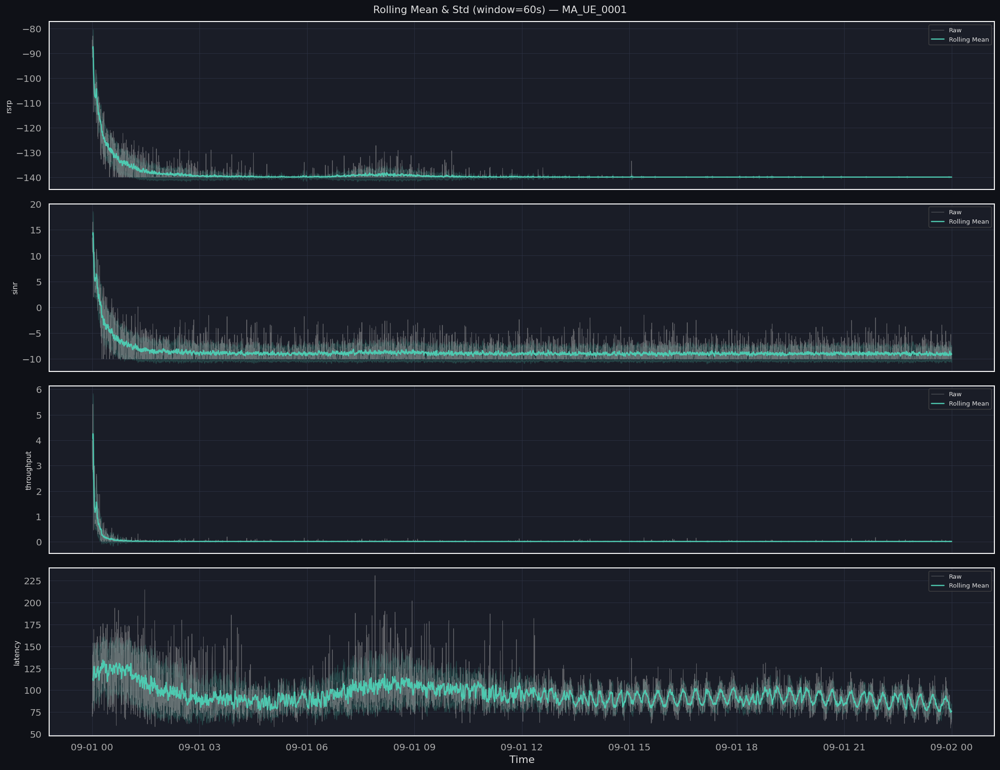

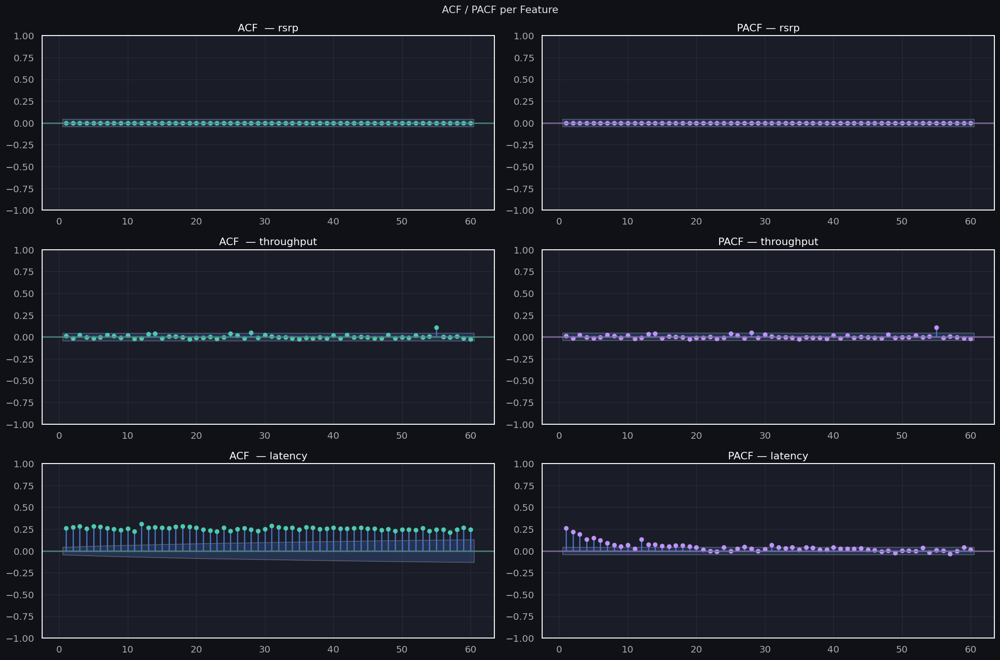

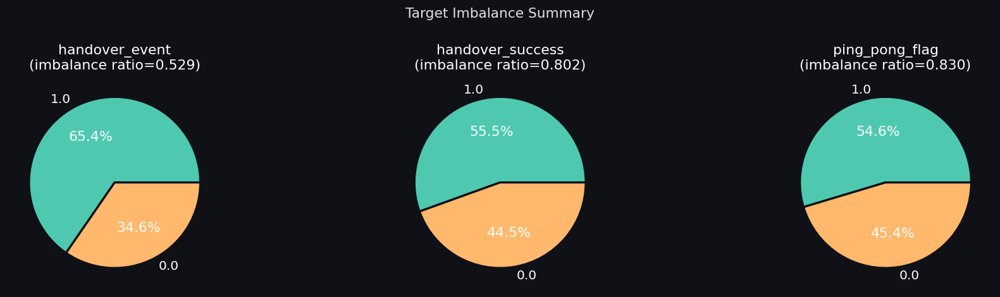

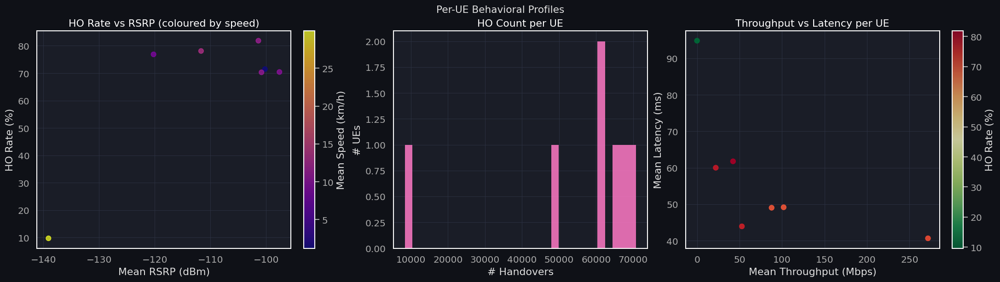

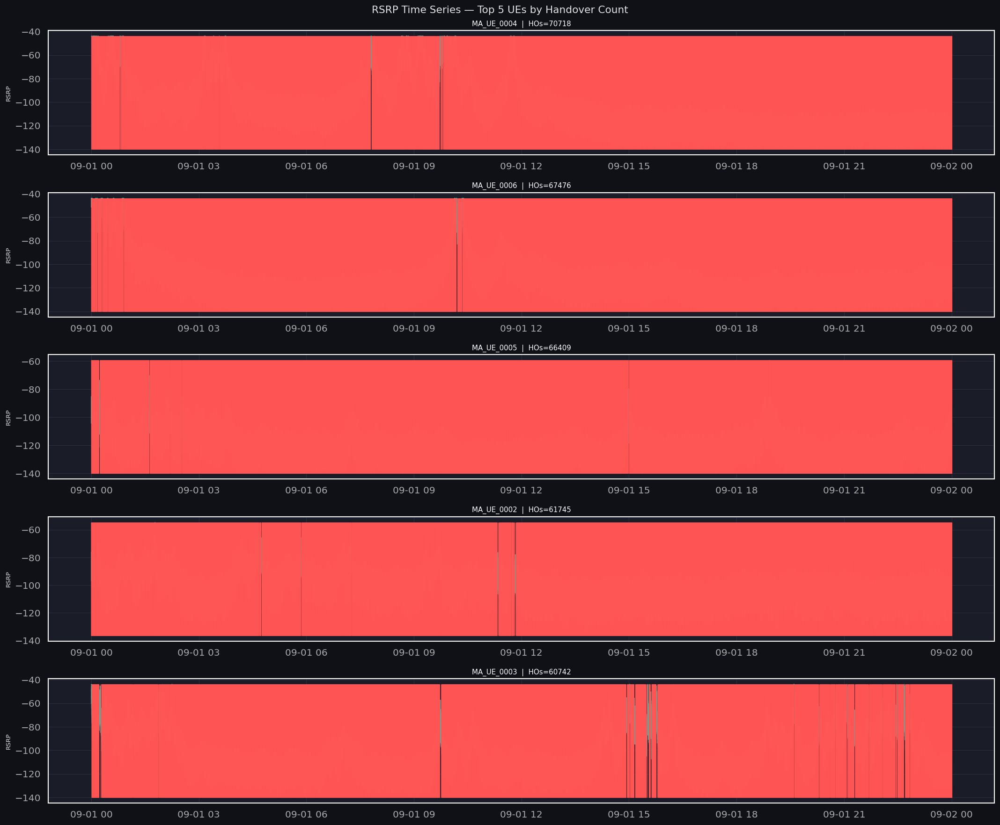

...

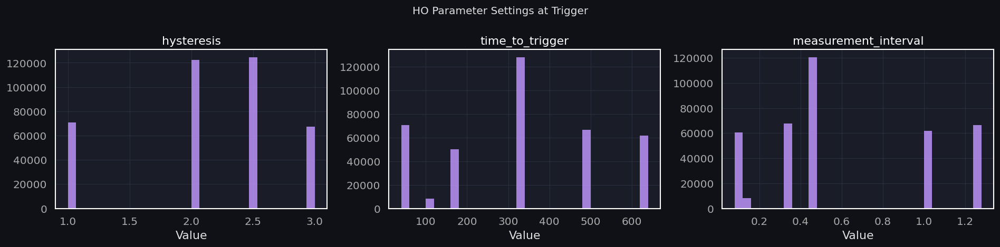

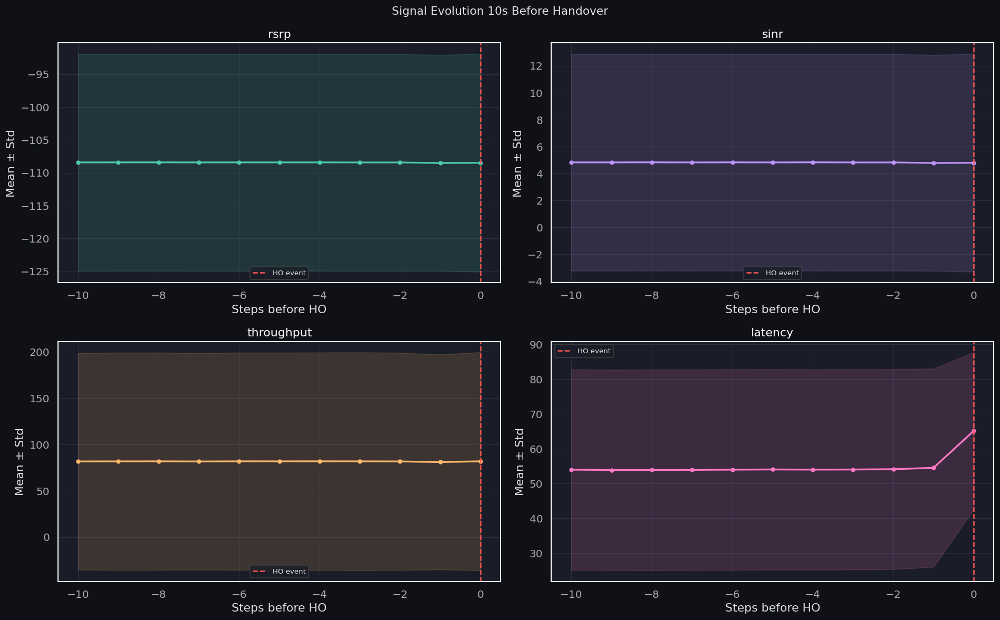

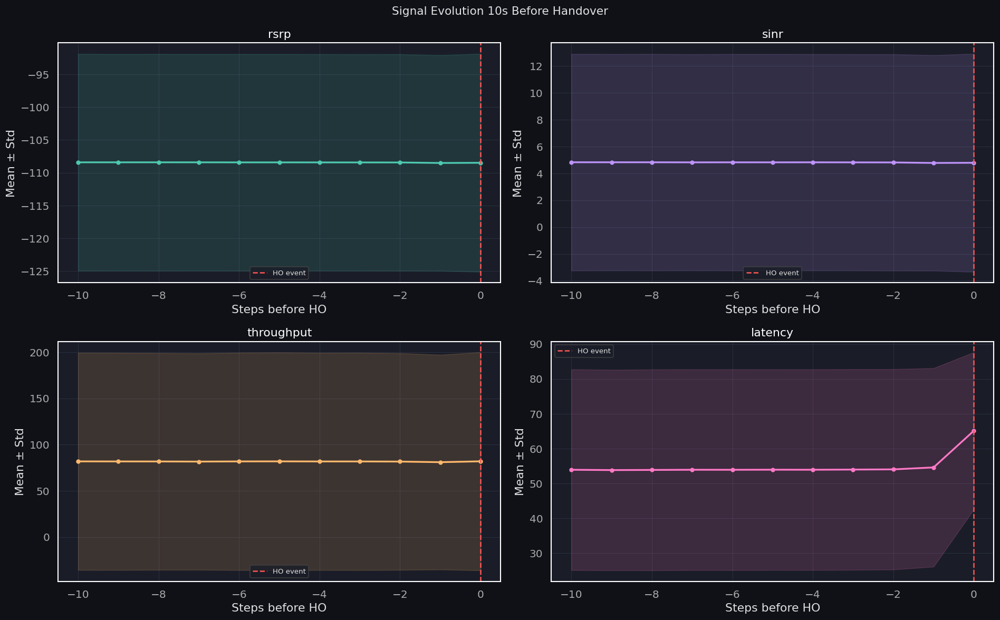

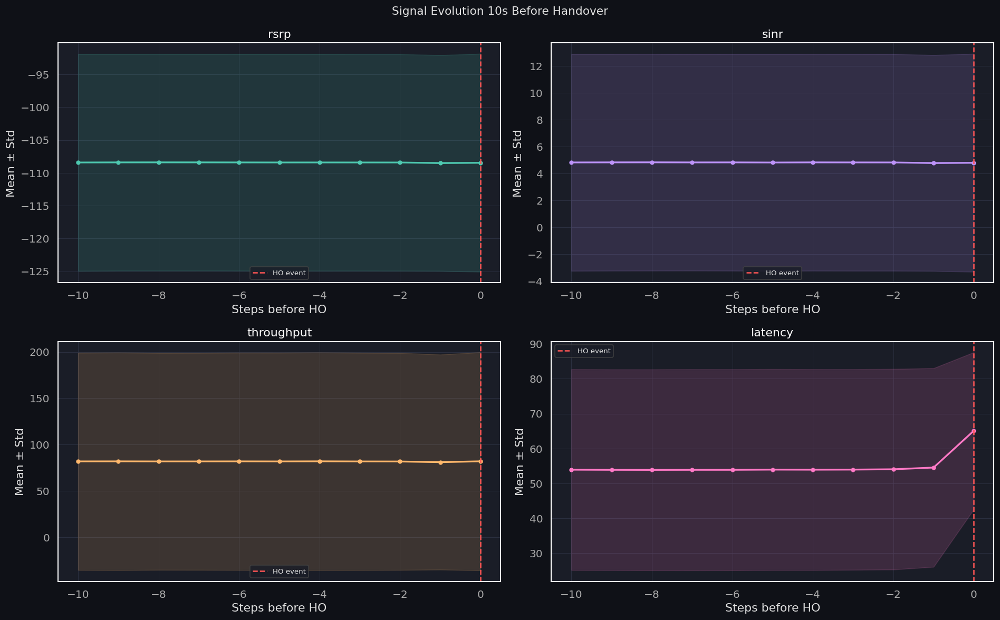

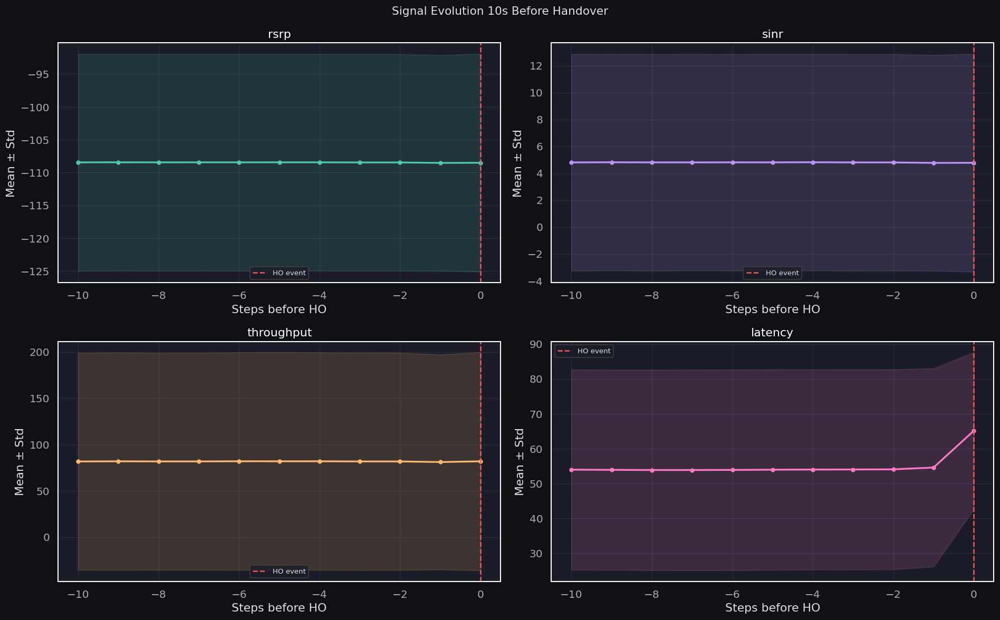

In [37]:
%matplotlib inline
PRE_HO_STEPS = 10
COLS = ['rsrp', 'sinr', 'throughput', 'latency']

df = df.sort_values(['ue_id', 'timestamp']).reset_index(drop=True)

ho_idx = df.index[df["handover_event"] == 1].to_numpy()
if len(ho_idx) > 300_000:
    ho_idx = np.random.choice(ho_idx, 300_000, replace=False)

offsets   = np.arange(-PRE_HO_STEPS, 1)                          # (-10 … 0)
positions = (ho_idx[:, None] + offsets).clip(0, len(df) - 1)     # fix: clip upper bound too
flat_idx  = positions.ravel()

pre_ho_df = df[COLS].iloc[flat_idx].copy().reset_index(drop=True) # fix: reset index
pre_ho_df['step'] = np.tile(offsets, len(ho_idx))

# Drop cross-UE contaminated rows
ho_ue  = df['ue_id'].iloc[ho_idx].to_numpy().repeat(PRE_HO_STEPS + 1)
row_ue = df['ue_id'].iloc[flat_idx].to_numpy()
pre_ho_df = pre_ho_df[ho_ue == row_ue].reset_index(drop=True)    # fix: reset after filter

# Quick sanity check — will print nothing if all good
assert len(pre_ho_df) > 0, "pre_ho_df is empty — check handover_event column values"
print(f"Windows built: {len(ho_idx):,} HO events → {len(pre_ho_df):,} rows")

agg = pre_ho_df.groupby('step')[COLS].agg(['mean', 'std'])

# Plot
fig, axes = plt.subplots(2, 2, figsize=(16, 10))
fig.suptitle(f'Signal Evolution {PRE_HO_STEPS}s Before Handover', fontsize=13)

for ax, col, color in zip(axes.flat, COLS, ['#4ec9b0','#bd93f9','#ffb86c','#ff79c6']):
    m, s = agg[col]['mean'], agg[col]['std']
    ax.plot(agg.index, m, color=color, lw=2, marker='o', ms=4)
    ax.fill_between(agg.index, m-s, m+s, alpha=0.15, color=color)
    ax.axvline(0, color='#ff5555', ls='--', lw=1.5, label='HO event')
    ax.set(title=col, xlabel='Steps before HO', ylabel='Mean ± Std')
    ax.legend(fontsize=8)

plt.tight_layout()
plt.show()

 - Image 15 shows speed at HO trigger points has a statistically significant difference (MW p=4.6e-25, HO median 10 km/h vs no-HO median 10.8 km/h)

## 23. Signal Evolution Before Handover (Detailed)


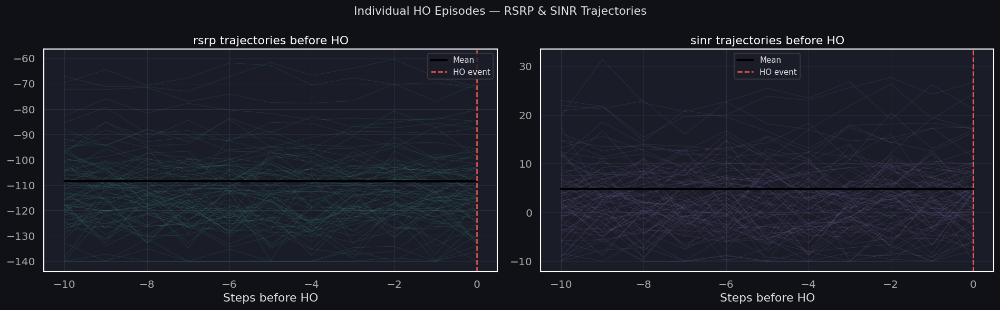

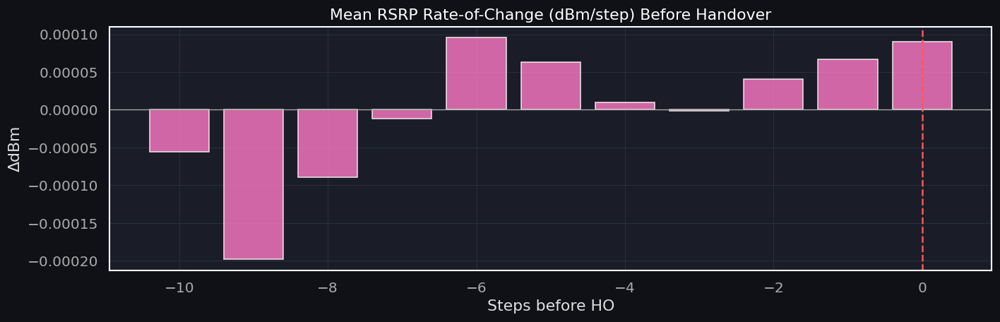

In [40]:
if not pre_ho_df.empty:
    fig, axes = plt.subplots(1, 2, figsize=(16, 5))
    fig.suptitle('Individual HO Episodes — RSRP & SINR Trajectories', fontsize=13)

    for ax, col, color in zip(axes, ['rsrp', 'sinr'], ['#4ec9b0', '#bd93f9']):
        # Sample individual trajectories
        sample_eps = pre_ho_df.groupby('step').head(80)
        for _, sub in sample_eps.groupby(sample_eps.index // (PRE_HO_STEPS + 1)):
            ax.plot(sub['step'], sub[col], color=color, lw=0.5, alpha=0.15)

        agg = pre_ho_df.groupby('step')[col].mean()
        ax.plot(agg.index, agg.values, color='black', lw=2.5, label='Mean')
        ax.axvline(0, color='#ff5555', ls='--', lw=1.5, label='HO event')
        ax.set(title=f'{col} trajectories before HO', xlabel='Steps before HO')
        ax.legend(fontsize=9)

    plt.tight_layout()
    plt.show()

    # ── Rate of change of RSRP ──
    pre_ho_df = pre_ho_df.sort_values('step')
    pre_ho_df['rsrp_gradient'] = pre_ho_df.groupby('step')['rsrp'].diff()
    grad_agg = pre_ho_df.groupby('step')['rsrp_gradient'].agg(['mean', 'std'])

    fig, ax = plt.subplots(figsize=(12, 4))
    ax.bar(grad_agg.index, grad_agg['mean'], color='#ff79c6', alpha=0.8)
    ax.axvline(0, color='#ff5555', ls='--', lw=1.5)
    ax.axhline(0, color='#aaa', lw=0.8)
    ax.set(title='Mean RSRP Rate-of-Change (dBm/step) Before Handover',
           xlabel='Steps before HO', ylabel='ΔdBm')
    plt.tight_layout()
    plt.show()

## 24. Feature Importance (Random Forest Proxy)


RF Accuracy : 0.9996


/home/wassim/miniconda3/envs/handover_prediction/lib/python3.12/site-packages/sklearn/utils/parallel.py:144: UserWarning: `sklearn.utils.parallel.delayed` should be used with `sklearn.utils.parallel.Parallel` to make it possible to propagate the scikit-learn configuration of the current thread to the joblib workers.
  warnings.warn(
/home/wassim/miniconda3/envs/handover_prediction/lib/python3.12/site-packages/sklearn/utils/parallel.py:144: UserWarning: `sklearn.utils.parallel.delayed` should be used with `sklearn.utils.parallel.Parallel` to make it possible to propagate the scikit-learn configuration of the current thread to the joblib workers.
  warnings.warn(
/home/wassim/miniconda3/envs/handover_prediction/lib/python3.12/site-packages/sklearn/utils/parallel.py:144: UserWarning: `sklearn.utils.parallel.delayed` should be used with `sklearn.utils.parallel.Parallel` to make it possible to propagate the scikit-learn configuration of the current thread to the joblib workers.
  warnings.w

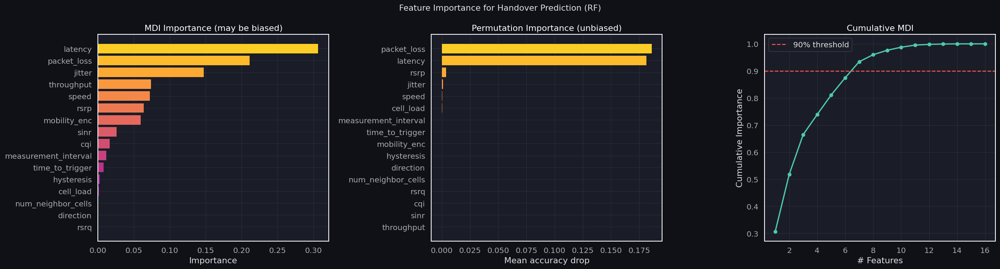


→ 7 features needed to reach 90% cumulative importance
Top 5 MDI  : ['latency', 'packet_loss', 'jitter', 'throughput', 'speed']
Top 5 Perm : ['packet_loss', 'latency', 'rsrp', 'jitter', 'speed']


In [42]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.inspection import permutation_importance

FEAT_COLS = ['rsrp','sinr','rsrq','cqi','speed','direction',
             'cell_load','num_neighbor_cells','latency','throughput',
             'packet_loss','jitter','hysteresis','time_to_trigger',
             'measurement_interval']
FEAT_COLS = [c for c in FEAT_COLS if c in df.columns]

# ── FIX 1: copy before mutating, encode before dropna ──
df_rf = df[FEAT_COLS + ['mobility_type', 'handover_event']].copy()
df_rf['mobility_enc'] = LabelEncoder().fit_transform(df_rf['mobility_type'].astype(str))
df_rf = df_rf.drop(columns='mobility_type').dropna()

X = df_rf.drop(columns='handover_event')
y = df_rf['handover_event']

# ── FIX 2: cap training size for speed ──
MAX_TRAIN = 200_000
if len(X) > MAX_TRAIN:
    X, _, y, _ = train_test_split(X, y, train_size=MAX_TRAIN,
                                  stratify=y, random_state=42)

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, stratify=y, random_state=42)

rf = RandomForestClassifier(n_estimators=150, max_depth=8, n_jobs=-1,
                             class_weight='balanced', random_state=42)
rf.fit(X_train, y_train)
print(f'RF Accuracy : {rf.score(X_test, y_test):.4f}')

feat_names  = X.columns.tolist()
importances = rf.feature_importances_          # MDI (fast, biased)
sorted_idx  = np.argsort(importances)[::-1]

# ── FIX 3: permutation importance (unbiased, run on test set) ──
perm = permutation_importance(rf, X_test, y_test,
                               n_repeats=10, n_jobs=-1, random_state=42)
perm_sorted = np.argsort(perm.importances_mean)[::-1]

# ── Plot ──
fig, axes = plt.subplots(1, 3, figsize=(22, 6))
fig.suptitle('Feature Importance for Handover Prediction (RF)', fontsize=13)

# MDI bar
colors = plt.cm.plasma(np.linspace(0.2, 0.9, len(feat_names)))
axes[0].barh([feat_names[i] for i in sorted_idx[::-1]],
             [importances[i] for i in sorted_idx[::-1]],
             color=colors, edgecolor='none')
axes[0].set(title='MDI Importance (may be biased)', xlabel='Importance')

# Permutation importance
axes[1].barh([feat_names[i] for i in perm_sorted[::-1]],
             [perm.importances_mean[i] for i in perm_sorted[::-1]],
             color=colors, edgecolor='none')
axes[1].set(title='Permutation Importance (unbiased)', xlabel='Mean accuracy drop')

# Cumulative MDI
cum_imp = np.cumsum([importances[i] for i in sorted_idx])
axes[2].plot(range(1, len(feat_names) + 1), cum_imp,
             color='#4ec9b0', lw=2, marker='o', ms=5)
axes[2].axhline(0.9, color='#ff5555', ls='--', lw=1.5, label='90% threshold')
axes[2].set(title='Cumulative MDI', xlabel='# Features', ylabel='Cumulative Importance')
axes[2].legend()

plt.tight_layout()
plt.show()

n90 = np.searchsorted(cum_imp, 0.9) + 1
print(f'\n→ {n90} features needed to reach 90% cumulative importance')
print('Top 5 MDI  :', [feat_names[i] for i in sorted_idx[:5]])
print('Top 5 Perm :', [feat_names[i] for i in perm_sorted[:5]])

## 25. Temporal Lag Feature Analysis


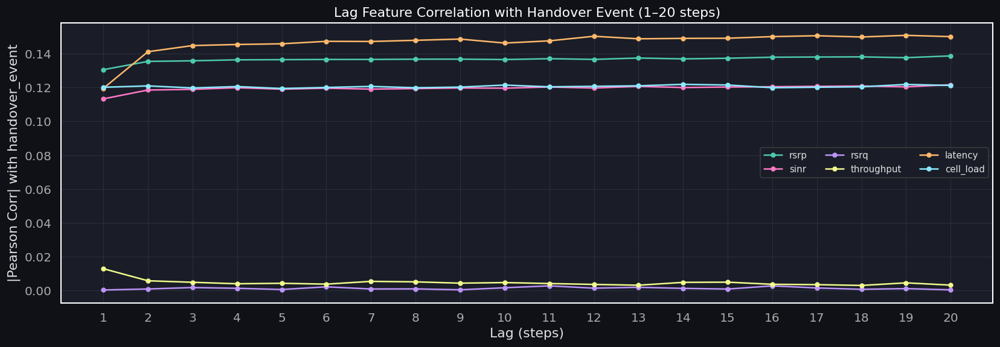

,feature,best_lag,max_corr
4,latency,19,0.1510
0,rsrp,20,0.1388
5,cell_load,14,0.1219
1,sinr,20,0.1217
3,throughput,1,0.0127
2,rsrq,11,0.0025


In [43]:
# ── Build lag features and measure predictive correlation ─────────────────────
LAG_RANGE  = range(1, 21)   # lags 1–20 steps
LAG_TARGET = 'handover_event'
LAG_FEATURES = ['rsrp', 'sinr', 'rsrq', 'throughput', 'latency', 'cell_load']

df_lag = df.sort_values(['ue_id','timestamp']).copy()
lag_corr = {col: [] for col in LAG_FEATURES}

for lag in LAG_RANGE:
    for col in LAG_FEATURES:
        df_lag[f'{col}_lag{lag}'] = df_lag.groupby('ue_id')[col].shift(lag)
        c = df_lag[[f'{col}_lag{lag}', LAG_TARGET]].dropna().corr().iloc[0,1]
        lag_corr[col].append(abs(c))

fig, ax = plt.subplots(figsize=(14, 5))
for i, col in enumerate(LAG_FEATURES):
    ax.plot(list(LAG_RANGE), lag_corr[col], marker='o', ms=4,
            color=ACCENT_COLORS[i % len(ACCENT_COLORS)], label=col, lw=1.5)

ax.set_xlabel('Lag (steps)')
ax.set_ylabel('|Pearson Corr| with handover_event')
ax.set_title('Lag Feature Correlation with Handover Event (1–20 steps)')
ax.legend(ncol=3, fontsize=9)
ax.set_xticks(list(LAG_RANGE))
plt.tight_layout()
plt.show()

# ── Optimal lag summary table ─────────────────────────────────────────────────
best_lag_df = pd.DataFrame({
    'feature': LAG_FEATURES,
    'best_lag': [list(LAG_RANGE)[np.argmax(lag_corr[c])] for c in LAG_FEATURES],
    'max_corr': [max(lag_corr[c]) for c in LAG_FEATURES]
}).sort_values('max_corr', ascending=False)

display(best_lag_df.style.format({'max_corr': '{:.4f}'})
        .bar(subset='max_corr', color='#bd93f9')
        .set_caption('Best Lag per Feature for HO Prediction'))

## 26. Outlier Detection


Z-score outliers (|z|>3) : 24,465  (4.15%)
IQR outliers             : 57,291  (9.72%)
Isolation Forest outliers: 29,464  (5.00%)


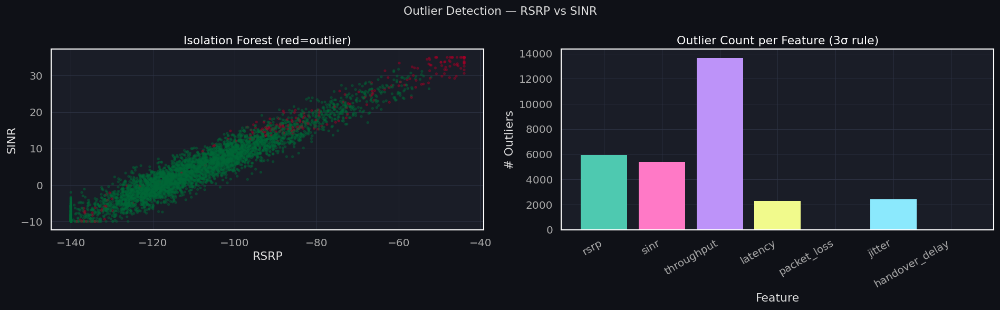

In [44]:
from sklearn.ensemble import IsolationForest
from scipy.stats import zscore

OUTLIER_COLS = ['rsrp','sinr','throughput','latency','packet_loss','jitter','handover_delay']
OUTLIER_COLS = [c for c in OUTLIER_COLS if c in df.columns]

df_out = df[OUTLIER_COLS].dropna()
idx_out = df_out.index

# ── Z-score method ────────────────────────────────────────────────────────────
z = np.abs(zscore(df_out))
zscore_outliers = (z > 3).any(axis=1)
print(f'Z-score outliers (|z|>3) : {zscore_outliers.sum():,}  ({zscore_outliers.mean()*100:.2f}%)')

# ── IQR method ────────────────────────────────────────────────────────────────
Q1 = df_out.quantile(0.25)
Q3 = df_out.quantile(0.75)
IQR = Q3 - Q1
iqr_mask = ((df_out < Q1 - 1.5*IQR) | (df_out > Q3 + 1.5*IQR)).any(axis=1)
print(f'IQR outliers             : {iqr_mask.sum():,}  ({iqr_mask.mean()*100:.2f}%)')

# ── Isolation Forest ──────────────────────────────────────────────────────────
iso = IsolationForest(contamination=0.05, random_state=42, n_jobs=-1)
iso_pred = iso.fit_predict(df_out)
iso_mask = iso_pred == -1
print(f'Isolation Forest outliers: {iso_mask.sum():,}  ({iso_mask.mean()*100:.2f}%)')

# ── Visualise outliers on RSRP vs SINR ───────────────────────────────────────
sample_idx = df_out.sample(min(5000, len(df_out)), random_state=42).index
sdf = df_out.loc[sample_idx]
iso_s = pd.Series(iso_mask, index=idx_out).loc[sample_idx]

fig, axes = plt.subplots(1, 2, figsize=(16, 5))
fig.suptitle('Outlier Detection — RSRP vs SINR', fontsize=13)

axes[0].scatter(sdf['rsrp'], sdf['sinr'], c=iso_s.astype(int),
                cmap='RdYlGn_r', s=5, alpha=0.4)
axes[0].set_title('Isolation Forest (red=outlier)')
axes[0].set_xlabel('RSRP'); axes[0].set_ylabel('SINR')

# Per-feature outlier count bar chart
out_counts = {col: ((df_out[col]-df_out[col].mean()).abs() > 3*df_out[col].std()).sum()
              for col in OUTLIER_COLS}
axes[1].bar(out_counts.keys(), out_counts.values(),
            color=[ACCENT_COLORS[i%len(ACCENT_COLORS)] for i in range(len(out_counts))],
            edgecolor='none')
axes[1].set_title('Outlier Count per Feature (3σ rule)')
axes[1].set_xlabel('Feature')
axes[1].set_ylabel('# Outliers')
plt.xticks(rotation=30, ha='right')

plt.tight_layout()
plt.show()

## 27. Mobility Pattern Analysis


,count,mean_speed,ho_rate,ping_pong_rate,mean_rsrp,mean_latency,mean_throughput
mobility_type,,,,,,,
highway,86400.00,29.95,9.68,6.16,-139.09,94.85,0.03
pedestrian,86400.00,1.22,71.46,65.68,-100.22,40.63,271.68
urban_ve,1.00,14.39,nan,nan,-110.85,nan,nan
urban_vehicle,416472.00,11.00,75.70,62.42,-106.68,52.90,59.88


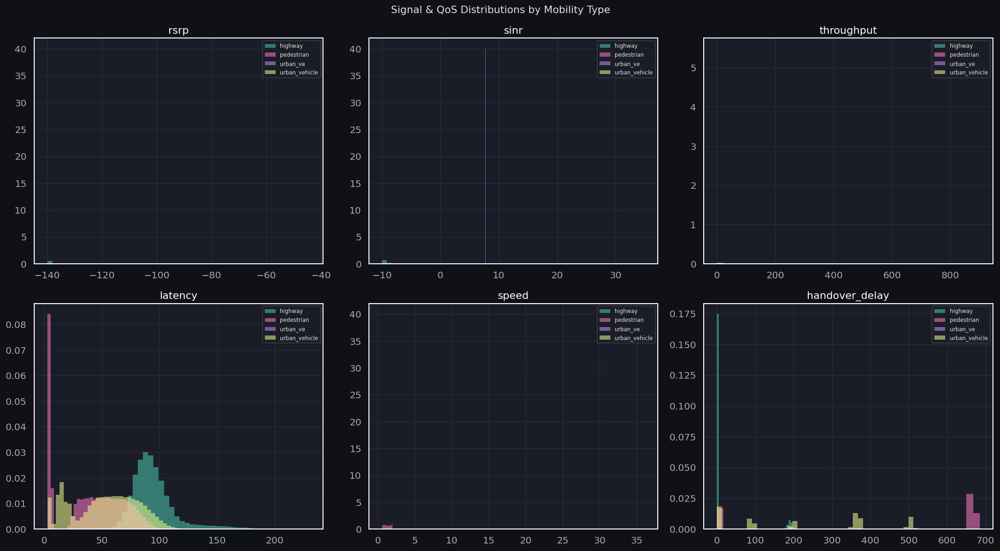

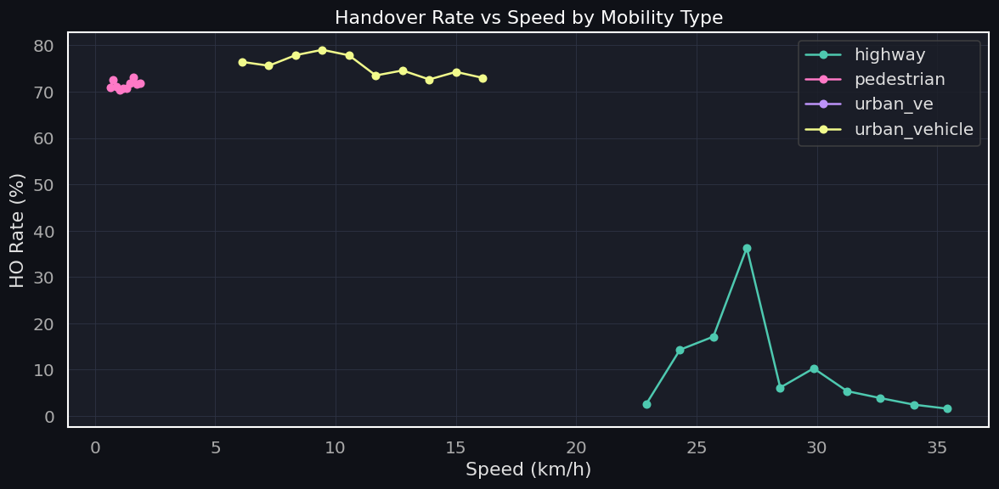

In [45]:
mob_types = df['mobility_type'].unique()

# ── Mobility type vs key KPIs ─────────────────────────────────────────────────
mob_stats = df.groupby('mobility_type').agg(
    count          = ('timestamp','count'),
    mean_speed     = ('speed','mean'),
    ho_rate        = ('handover_event','mean'),
    ping_pong_rate = ('ping_pong_flag','mean'),
    mean_rsrp      = ('rsrp','mean'),
    mean_latency   = ('latency','mean'),
    mean_throughput= ('throughput','mean'),
).reset_index()
mob_stats[['ho_rate','ping_pong_rate']] *= 100

display(mob_stats.set_index('mobility_type').style.format('{:.2f}')
        .background_gradient(cmap='RdYlGn', axis=0)
        .set_caption('KPIs by Mobility Type'))

fig, axes = plt.subplots(2, 3, figsize=(18, 10))
fig.suptitle('Signal & QoS Distributions by Mobility Type', fontsize=13)

kpi_cols = ['rsrp','sinr','throughput','latency','speed','handover_delay']
for ax, col in zip(axes.flat, kpi_cols):
    for i, mob in enumerate(sorted(mob_types)):
        data = df[df['mobility_type']==mob][col].dropna()
        ax.hist(data, bins=40, alpha=0.55, density=True,
                color=ACCENT_COLORS[i], label=mob, edgecolor='none')
    ax.set_title(col)
    ax.legend(fontsize=7)

plt.tight_layout()
plt.show()

# ── Speed vs HO rate scatter by mobility type ─────────────────────────────────
fig, ax = plt.subplots(figsize=(10, 5))
for i, mob in enumerate(sorted(mob_types)):
    sub = df[df['mobility_type'] == mob]
    spd_bins = pd.cut(sub['speed'], bins=10)
    ho_by_spd = sub.groupby(spd_bins)['handover_event'].mean() * 100
    mids = [iv.mid for iv in ho_by_spd.index]
    ax.plot(mids, ho_by_spd.values, marker='o', ms=5,
            color=ACCENT_COLORS[i], label=mob, lw=1.5)
ax.set_xlabel('Speed (km/h)')
ax.set_ylabel('HO Rate (%)')
ax.set_title('Handover Rate vs Speed by Mobility Type')
ax.legend()
plt.tight_layout()
plt.show()

## 28. Transition Matrix Between Cells


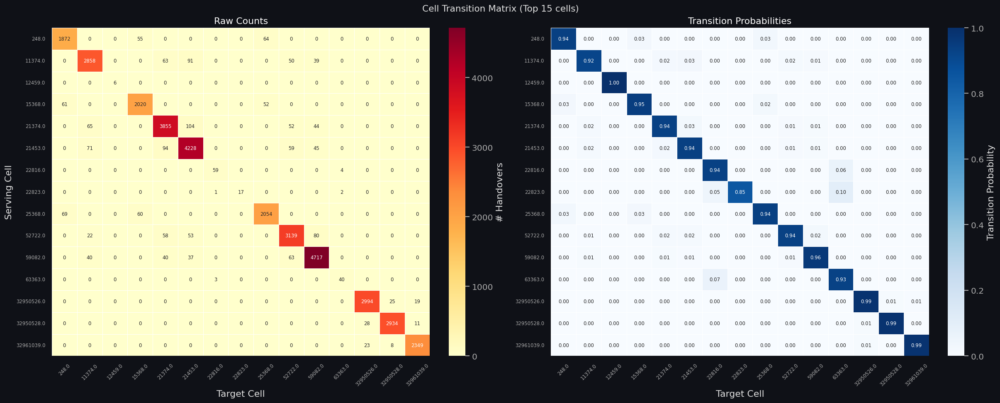


Most common handover route: 59082.0 → 59082.0  (4717 HOs)


In [47]:
ho_df_tm = df[df['handover_event'] == 1][['serving_cell_id','target_cell_id']].dropna()

TOP_CELLS = 15
top_cells = df['serving_cell_id'].value_counts().head(TOP_CELLS).index.tolist()
tm_df = ho_df_tm[
    ho_df_tm['serving_cell_id'].isin(top_cells) &
    ho_df_tm['target_cell_id'].isin(top_cells)
]

trans_matrix = pd.crosstab(tm_df['serving_cell_id'], tm_df['target_cell_id'])
trans_prob   = trans_matrix.div(trans_matrix.sum(axis=1), axis=0).fillna(0)

# ── FIX: use constrained_layout=True instead of tight_layout() ──
fig, axes = plt.subplots(1, 2, figsize=(20, 8), constrained_layout=True)
fig.suptitle(f'Cell Transition Matrix (Top {TOP_CELLS} cells)', fontsize=13)

heatmap_kws = dict(linewidths=0.3, annot_kws={'size': 7})
tick_kws    = dict(axis='x', rotation=45, labelsize=7)

sns.heatmap(trans_matrix, ax=axes[0], cmap='YlOrRd', annot=True, fmt='d',
            cbar_kws={'label': '# Handovers'}, **heatmap_kws)
axes[0].set(title='Raw Counts', xlabel='Target Cell', ylabel='Serving Cell')
axes[0].tick_params(**tick_kws)
axes[0].tick_params(axis='y', labelsize=7)

sns.heatmap(trans_prob, ax=axes[1], cmap='Blues', annot=True, fmt='.2f',
            cbar_kws={'label': 'Transition Probability'}, **heatmap_kws)
axes[1].set(title='Transition Probabilities', xlabel='Target Cell', ylabel='')
axes[1].tick_params(**tick_kws)
axes[1].tick_params(axis='y', labelsize=7)

plt.show()

flat_counts = trans_matrix.stack()
top_route   = flat_counts.idxmax()
print(f'\nMost common handover route: {top_route[0]} → {top_route[1]}  ({flat_counts.max()} HOs)')

## 29. Network Load vs Latency


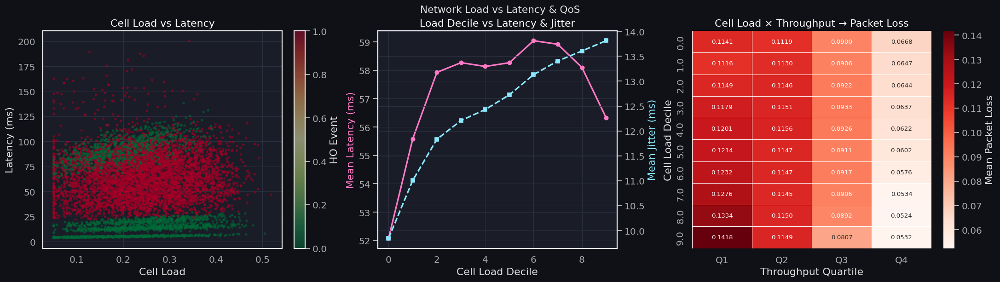

In [49]:
# ── FIX: constrained_layout=True + don't mutate df ──
fig, axes = plt.subplots(1, 3, figsize=(18, 5), constrained_layout=True)
fig.suptitle('Network Load vs Latency & QoS', fontsize=13)

samp = df.sample(min(8000, len(df)), random_state=42)

# Scatter: cell_load vs latency
sc = axes[0].scatter(samp['cell_load'], samp['latency'],
                     c=samp['handover_event'], cmap='RdYlGn_r', s=5, alpha=0.5)
plt.colorbar(sc, ax=axes[0], label='HO Event')
axes[0].set(title='Cell Load vs Latency', xlabel='Cell Load', ylabel='Latency (ms)')

# ── FIX: use local variable instead of df['load_bin'] ──
load_bin = pd.qcut(df['cell_load'], q=10, labels=False, duplicates='drop')
load_lat = df.groupby(load_bin).agg(
    mean_lat=('latency', 'mean'),
    mean_jitter=('jitter', 'mean'),
).reset_index()

axes[1].plot(load_lat['cell_load'], load_lat['mean_lat'],
             color='#ff79c6', marker='o', ms=5, lw=2, label='Latency')
ax2 = axes[1].twinx()
ax2.plot(load_lat['cell_load'], load_lat['mean_jitter'],
         color='#8be9fd', marker='s', ms=5, lw=2, ls='--', label='Jitter')
axes[1].set(title='Load Decile vs Latency & Jitter',
            xlabel='Cell Load Decile', ylabel='Mean Latency (ms)')
axes[1].yaxis.label.set_color('#ff79c6')
ax2.set_ylabel('Mean Jitter (ms)', color='#8be9fd')

# Heatmap
tp_bin   = pd.qcut(df['throughput'], q=4, labels=['Q1','Q2','Q3','Q4'], duplicates='drop')
heat     = df.groupby([load_bin, tp_bin])['packet_loss'].mean().unstack()
sns.heatmap(heat, ax=axes[2], cmap='Reds', annot=True, fmt='.4f',
            linewidths=0.3, annot_kws={'size': 8},
            cbar_kws={'label': 'Mean Packet Loss'})
axes[2].set(title='Cell Load × Throughput → Packet Loss',
            xlabel='Throughput Quartile', ylabel='Cell Load Decile')

plt.show()

## 30. Throughput vs Signal Strength


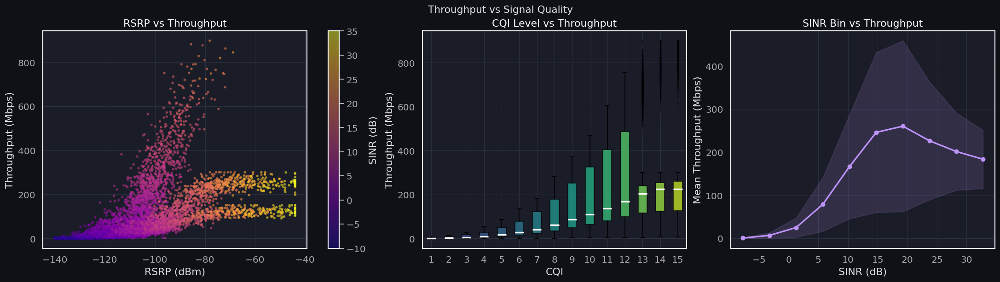

In [52]:
samp = df.sample(min(8000, len(df)), random_state=7)

# ── FIX: constrained_layout=True ──
fig, axes = plt.subplots(1, 3, figsize=(18, 5), constrained_layout=True)
fig.suptitle('Throughput vs Signal Quality', fontsize=13)

# RSRP vs Throughput
sc = axes[0].scatter(samp['rsrp'], samp['throughput'],
                     c=samp['sinr'], cmap='plasma', s=5, alpha=0.5)
plt.colorbar(sc, ax=axes[0], label='SINR (dB)')
axes[0].set(title='RSRP vs Throughput', xlabel='RSRP (dBm)', ylabel='Throughput (Mbps)')

# CQI vs Throughput
cqi_vals   = sorted(df['cqi'].dropna().unique())
cqi_groups = [df[df['cqi'] == v]['throughput'].dropna().values for v in cqi_vals]
bp = axes[1].boxplot(cqi_groups, patch_artist=True, notch=False,
                     medianprops=dict(color='white', lw=2),
                     flierprops=dict(marker='.', alpha=0.15, markersize=2))
for patch, color in zip(bp['boxes'],
                        plt.cm.viridis(np.linspace(0.1, 0.9, len(cqi_vals)))):
    patch.set_facecolor(color)
    patch.set_alpha(0.8)
axes[1].set_xticklabels([str(int(v)) for v in cqi_vals])
axes[1].set(title='CQI Level vs Throughput', xlabel='CQI', ylabel='Throughput (Mbps)')

# ── FIX: local sinr_bin, don't mutate df ──
sinr_bin = pd.cut(df['sinr'], bins=10)
sinr_tp  = df.groupby(sinr_bin)['throughput'].agg(['mean', 'std']).dropna().reset_index()
mids     = [iv.mid for iv in sinr_tp['sinr']]
axes[2].plot(mids, sinr_tp['mean'], color='#bd93f9', lw=2, marker='o', ms=5)
axes[2].fill_between(mids,
                     sinr_tp['mean'] - sinr_tp['std'],
                     sinr_tp['mean'] + sinr_tp['std'],
                     alpha=0.15, color='#bd93f9')
axes[2].set(title='SINR Bin vs Throughput',
            xlabel='SINR (dB)', ylabel='Mean Throughput (Mbps)')

plt.show()

## 31. Ping-Pong Handover Analysis


Ping-pong events  : 322,017  (54.65% of all records)
PP among HO events: 100.0%


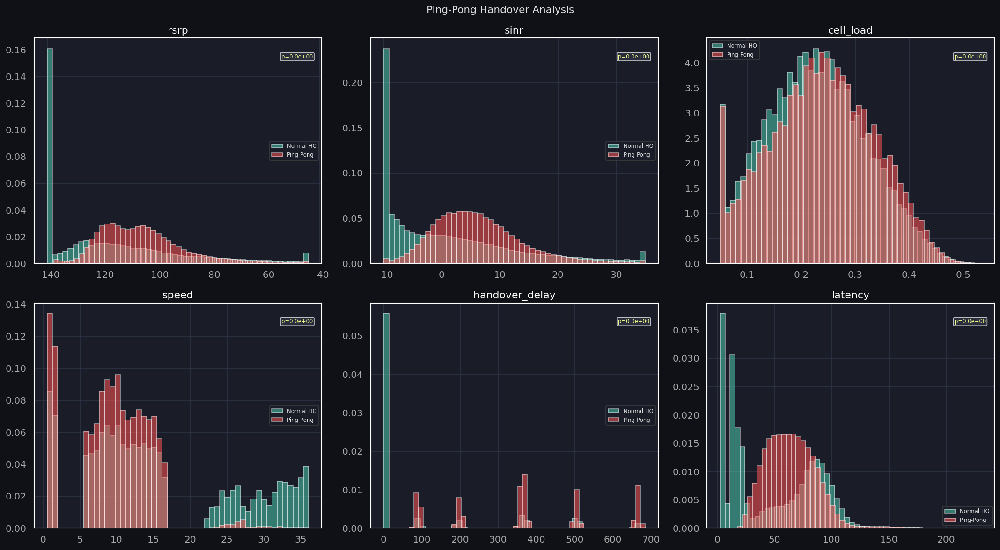

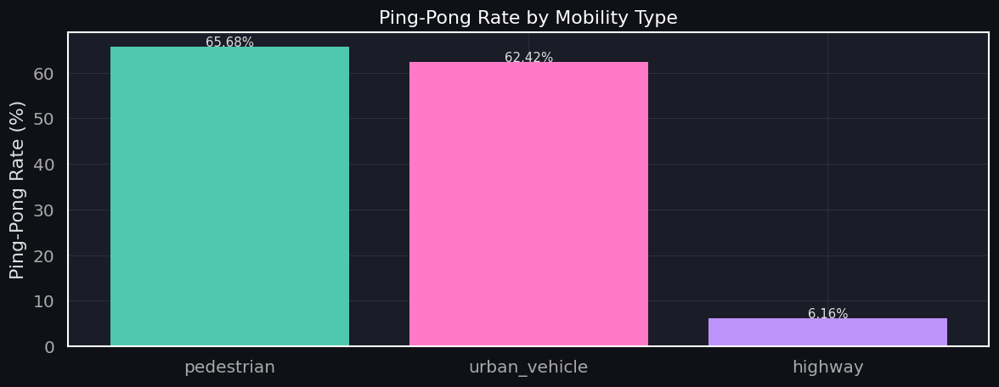

In [57]:
pp_df  = df[df['ping_pong_flag'] == 1]
npp_df = df[df['ping_pong_flag'] == 0]

print(f'Ping-pong events  : {len(pp_df):,}  ({len(pp_df)/len(df)*100:.2f}% of all records)')
if len(pp_df) > 0:
    print(f'PP among HO events: {pp_df["handover_event"].mean()*100:.1f}%')

fig, axes = plt.subplots(2, 3, figsize=(18, 10))
fig.suptitle('Ping-Pong Handover Analysis', fontsize=13)

compare_cols = ['rsrp','sinr','cell_load','speed','handover_delay','latency']
for ax, col in zip(axes.flat, compare_cols):
    ax.hist(npp_df[col].dropna(), bins=50, density=True, alpha=0.55,
            color='#4ec9b0', label='Normal HO')
    ax.hist(pp_df[col].dropna(),  bins=50, density=True, alpha=0.55,
            color='#ff5555',  label='Ping-Pong')
    ax.set_title(col)
    ax.legend(fontsize=7)
    if len(pp_df[col].dropna()) > 1:
        stat, pval = stats.mannwhitneyu(npp_df[col].dropna(), pp_df[col].dropna())
        ax.text(0.97, 0.91, f'p={pval:.1e}', ha='right', transform=ax.transAxes,
                fontsize=7, color='#f1fa8c',
                bbox=dict(boxstyle='round,pad=0.2', facecolor='#2e3344', alpha=0.7))

plt.tight_layout()
plt.show()

# ── Ping-pong rate by mobility type ──────────────────────────────────────────
pp_by_mob = df.groupby('mobility_type')['ping_pong_flag'].mean().sort_values(ascending=False) * 100
fig, ax = plt.subplots(figsize=(10, 4))
bars = ax.bar(pp_by_mob.index, pp_by_mob.values,
              color=[ACCENT_COLORS[i] for i in range(len(pp_by_mob))], edgecolor='none')
for bar, val in zip(bars, pp_by_mob.values):
    ax.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.1,
            f'{val:.2f}%', ha='center', fontsize=9)
ax.set_ylabel('Ping-Pong Rate (%)')
ax.set_title('Ping-Pong Rate by Mobility Type')
plt.tight_layout()
plt.show()

## 32. Network QoS Impact of Handover


QoS windows: 385,368 HO events → 6,165,607 rows


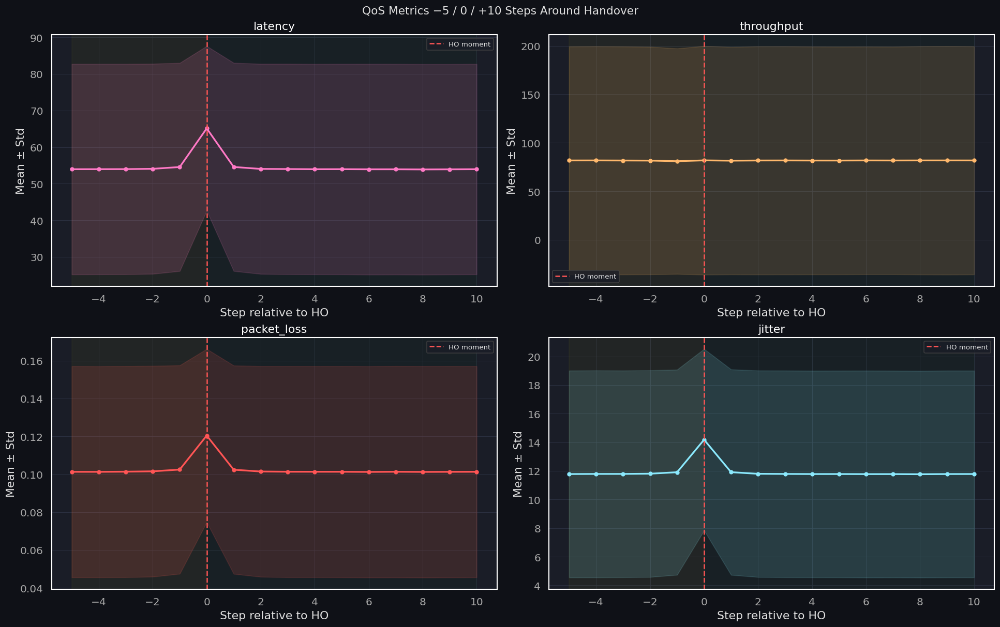

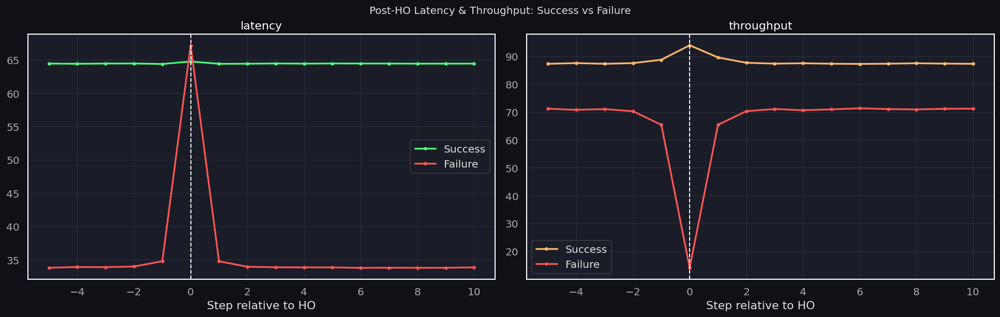

In [54]:
PRE  = 5
POST = 10
COLS_QOS = ['latency', 'throughput', 'packet_loss', 'jitter', 'handover_success']
COLS_QOS = [c for c in COLS_QOS if c in df.columns]

df = df.sort_values(['ue_id', 'timestamp']).reset_index(drop=True)
ue_ids = df['ue_id'].to_numpy()

ho_idx = df.index[df['handover_event'] == 1].to_numpy()

# ── Vectorized window build ──
offsets   = np.arange(-PRE, POST + 1)                          # (-5 … +10)
positions = (ho_idx[:, None] + offsets).clip(0, len(df) - 1)  # (N, 16)
flat_idx  = positions.ravel()

qos_df = df[COLS_QOS].iloc[flat_idx].copy().reset_index(drop=True)
qos_df['rel_step'] = np.tile(offsets, len(ho_idx))

# ── Drop cross-UE contaminated rows ──
ho_ue  = ue_ids[ho_idx].repeat(len(offsets))
row_ue = ue_ids[flat_idx]
qos_df = qos_df[ho_ue == row_ue].reset_index(drop=True)

print(f"QoS windows: {len(ho_idx):,} HO events → {len(qos_df):,} rows")

# ── Plot 1: QoS metrics around HO ──
qos_metrics = ['latency', 'throughput', 'packet_loss', 'jitter']
qos_metrics = [c for c in qos_metrics if c in qos_df.columns]
colors_q    = ['#ff79c6', '#ffb86c', '#ff5555', '#8be9fd']

fig, axes = plt.subplots(2, 2, figsize=(16, 10), constrained_layout=True)
fig.suptitle(f'QoS Metrics −{PRE} / 0 / +{POST} Steps Around Handover', fontsize=13)

for ax, col, color in zip(axes.flat, qos_metrics, colors_q):
    agg = qos_df.groupby('rel_step')[col].agg(['mean', 'std'])
    ax.plot(agg.index, agg['mean'], color=color, lw=2, marker='o', ms=4)
    ax.fill_between(agg.index, agg['mean'] - agg['std'], agg['mean'] + agg['std'],
                    alpha=0.15, color=color)
    ax.axvline(0,    color='#ff5555', ls='--', lw=1.5, label='HO moment')
    ax.axvspan(-PRE, 0,    alpha=0.04, color='yellow')
    ax.axvspan(0,    POST, alpha=0.04, color='green')
    ax.set(title=col, xlabel='Step relative to HO', ylabel='Mean ± Std')
    ax.legend(fontsize=8)

plt.show()

# ── Plot 2: Success vs Failure ──
if 'handover_success' in qos_df.columns:
    fig, axes = plt.subplots(1, 2, figsize=(16, 5), constrained_layout=True)
    fig.suptitle('Post-HO Latency & Throughput: Success vs Failure', fontsize=12)

    for ax, col, color_ok in zip(axes, ['latency', 'throughput'], ['#50fa7b', '#ffb86c']):
        for succ_val, label, color in [(1, 'Success', color_ok), (0, 'Failure', '#ff5555')]:
            agg = (qos_df[qos_df['handover_success'] == succ_val]
                   .groupby('rel_step')[col].mean())
            if len(agg):
                ax.plot(agg.index, agg.values, lw=2, marker='o', ms=3,
                        color=color, label=label)
        ax.axvline(0, color='white', ls='--', lw=1.2)
        ax.set(title=col, xlabel='Step relative to HO')
        ax.legend()

    plt.show()

## 33. Cell Load vs Handover Rate


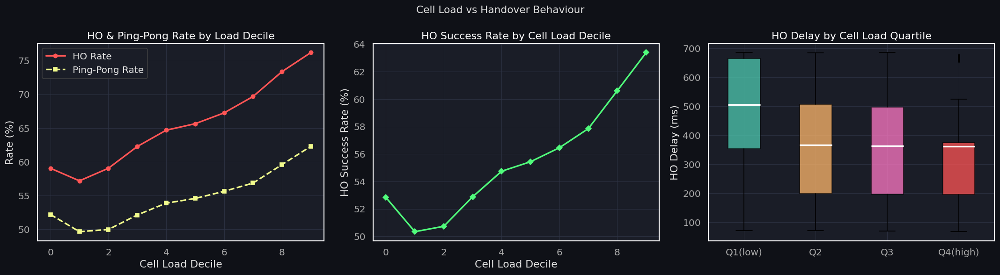


── Statistical Test: Cell Load vs HO Delay ──
Kruskal-Wallis H=28164.05, p=0.00e+00  → Significant difference in HO delay across load groups


In [55]:
fig, axes = plt.subplots(1, 3, figsize=(18, 5))
fig.suptitle('Cell Load vs Handover Behaviour', fontsize=13)

# ── HO rate across cell load deciles ─────────────────────────────────────────
df['load_decile'] = pd.qcut(df['cell_load'], q=10, labels=False, duplicates='drop')
load_ho = df.groupby('load_decile').agg(
    ho_rate   = ('handover_event', 'mean'),
    pp_rate   = ('ping_pong_flag', 'mean'),
    ho_success= ('handover_success', 'mean'),
).reset_index()

axes[0].plot(load_ho['load_decile'], load_ho['ho_rate']*100,
             color='#ff5555', lw=2, marker='o', ms=5, label='HO Rate')
axes[0].plot(load_ho['load_decile'], load_ho['pp_rate']*100,
             color='#f1fa8c', lw=2, marker='s', ms=5, ls='--', label='Ping-Pong Rate')
axes[0].set_xlabel('Cell Load Decile')
axes[0].set_ylabel('Rate (%)')
axes[0].set_title('HO & Ping-Pong Rate by Load Decile')
axes[0].legend()

# ── HO success rate vs load ───────────────────────────────────────────────────
axes[1].plot(load_ho['load_decile'], load_ho['ho_success']*100,
             color='#50fa7b', lw=2, marker='D', ms=5)
axes[1].set_xlabel('Cell Load Decile')
axes[1].set_ylabel('HO Success Rate (%)')
axes[1].set_title('HO Success Rate by Cell Load Decile')

# ── HO delay distribution by load quartile ───────────────────────────────────
df['load_q'] = pd.qcut(df['cell_load'], q=4, labels=['Q1(low)','Q2','Q3','Q4(high)'], duplicates='drop')
ho_sub = df[df['handover_event']==1]
delay_by_load = [ho_sub[ho_sub['load_q']==q]['handover_delay'].dropna().values
                 for q in ['Q1(low)','Q2','Q3','Q4(high)']]
bp = axes[2].boxplot(delay_by_load, patch_artist=True, notch=False,
                     medianprops=dict(color='white', lw=2),
                     flierprops=dict(marker='.', alpha=0.2, markersize=3))
for patch, color in zip(bp['boxes'], ['#4ec9b0','#ffb86c','#ff79c6','#ff5555']):
    patch.set_facecolor(color); patch.set_alpha(0.75)
axes[2].set_xticklabels(['Q1(low)','Q2','Q3','Q4(high)'])
axes[2].set_title('HO Delay by Cell Load Quartile')
axes[2].set_ylabel('HO Delay (ms)')

plt.tight_layout()
plt.show()

print('\n── Statistical Test: Cell Load vs HO Delay ──')
from scipy.stats import kruskal
valid = [g for g in delay_by_load if len(g) > 1]
if len(valid) >= 2:
    stat, pval = kruskal(*valid)
    print(f'Kruskal-Wallis H={stat:.2f}, p={pval:.2e}  '
          f'→ {"Significant" if pval<0.05 else "Not significant"} difference in HO delay across load groups')

## 34. EDA Summary


In [56]:
print('═'*65)
print('  FULL EDA SUMMARY')
print('═'*65)
print(f'  Total records         : {len(df):,}')
print(f'  Features (raw)        : {df.shape[1]}')
print(f'  Unique UEs            : {df.ue_id.nunique()}')
print(f'  Time span             : {df.timestamp.min()} → {df.timestamp.max()}')
print(f'  Scenarios             : {", ".join([str(s) for s in sorted(df.scenario_id.unique())])}')
print(f'  Mobility types        : {", ".join(df.mobility_type.unique())}')
print('─'*65)
print(f'  Handover rate         : {df.handover_event.mean()*100:.2f}%')
print(f'  HO success rate       : {df[df.handover_event==1].handover_success.mean()*100:.2f}%')
print(f'  Ping-pong rate        : {df.ping_pong_flag.mean()*100:.2f}%')
print(f'  Mean HO delay         : {df[df.handover_event==1].handover_delay.mean():.1f} ms')
print('─'*65)
print(f'  Mean RSRP             : {df.rsrp.mean():.2f} dBm')
print(f'  Mean SINR             : {df.sinr.mean():.2f} dB')
print(f'  Mean RSRQ             : {df.rsrq.mean():.2f} dB')
print(f'  Mean CQI              : {df.cqi.mean():.2f}')
print('─'*65)
print(f'  Mean throughput       : {df.throughput.mean():.2f} Mbps')
print(f'  Mean latency          : {df.latency.mean():.2f} ms')
print(f'  Mean packet loss      : {df.packet_loss.mean()*100:.4f}%')
print(f'  Mean jitter           : {df.jitter.mean():.2f} ms')
print('─'*65)
print(f'  Mean speed            : {df.speed.mean():.1f} km/h')
print(f'  Unique serving cells  : {df.serving_cell_id.nunique()}')
print(f'  Mean cell load        : {df.cell_load.mean():.3f}')
print('═'*65)
print('  ✅ EDA complete — ready for DL sequence modelling!')
print('═'*65)

═════════════════════════════════════════════════════════════════
  FULL EDA SUMMARY
═════════════════════════════════════════════════════════════════
  Total records         : 589,273
  Features (raw)        : 32
  Unique UEs            : 7
  Time span             : 2024-09-01 00:00:00 → 2024-09-01 23:59:59
  Scenarios             : 1, 2, 3
  Mobility types        : highway, pedestrian, urban_vehicle, urban_ve
─────────────────────────────────────────────────────────────────
  Handover rate         : 65.40%
  HO success rate       : 84.88%
  Ping-pong rate        : 54.65%
  Mean HO delay         : 361.6 ms
─────────────────────────────────────────────────────────────────
  Mean RSRP             : -110.48 dBm
  Mean SINR             : 3.97 dB
  Mean RSRQ             : -19.04 dB
  Mean CQI              : 6.30
─────────────────────────────────────────────────────────────────
  Mean throughput       : 82.16 Mbps
  Mean latency          : 57.25 ms
  Mean packet loss      : 9.7163%
  Mean j

## ML Hypotheses by Detection Side

---

## Network Tower Side
*(features available at eNB/gNB: cell_load, num_neighbor_cells, hysteresis, time_to_trigger, handover_delay, ping_pong_flag)*

---

**H1 — Cell load is an independent congestion predictor orthogonal to signal quality**

The Feature Correlation Matrix shows cell_load has near-zero correlation with RSRP/SINR (r≈0.05) but positive correlation with latency (r=0.19) and negative with throughput (r=−0.20). The Cell Context Analysis confirms a clear degradation in throughput as cell load increases, with RSRP remaining unchanged across the load range. This means a UE can have perfectly good signal but still experience high latency and low throughput due to cell congestion — a condition invisible to any UE-side measurement. Cell load is therefore a genuinely orthogonal feature that adds information RSRP alone cannot capture, and should be included as an independent predictor in Task B (success prediction).

- ``conclusion :`` if we can have cell load and RSRP(any of the correlated parameters) in one device (tower or mobile) then we can increase the performence of the prediction.


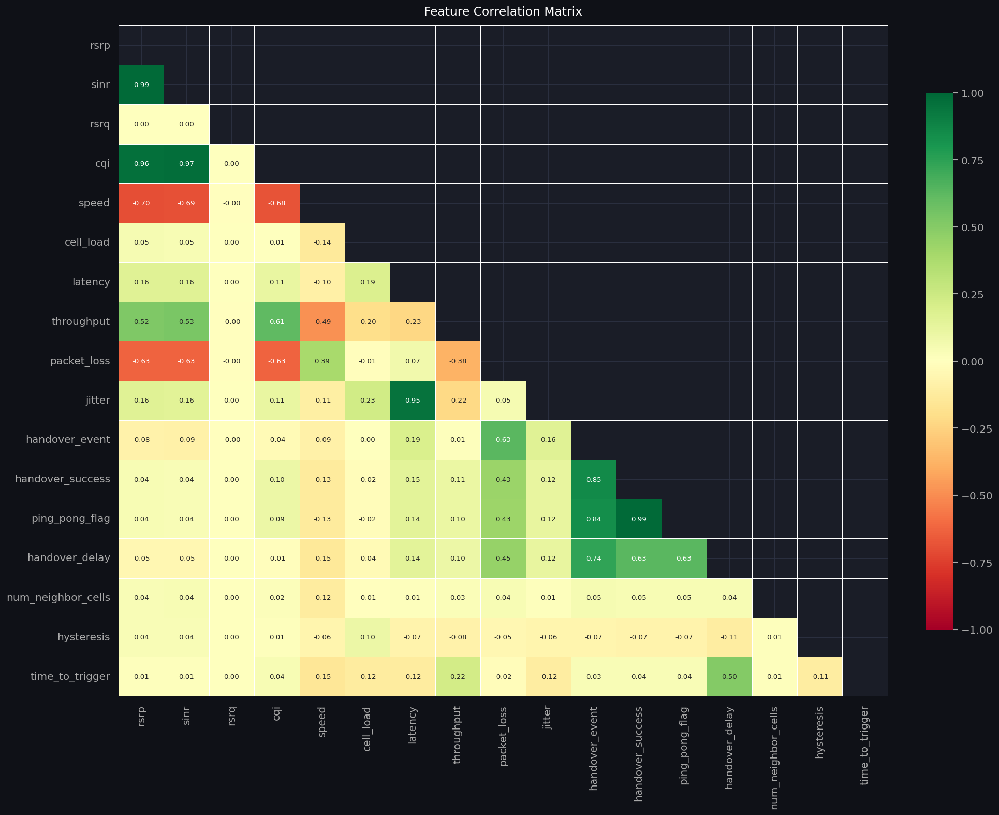
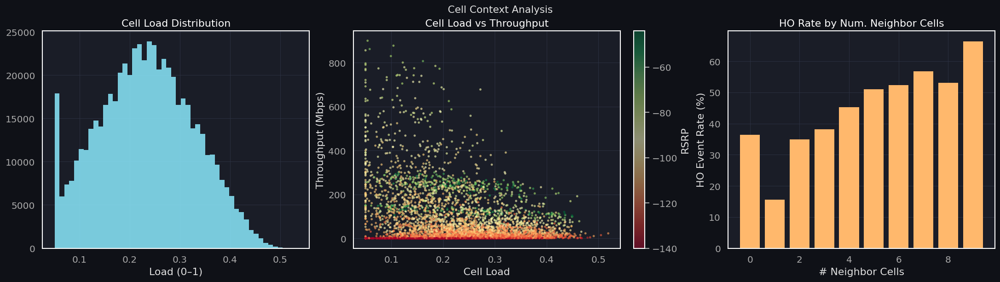


---

**H2 — Number of neighbor cells is the strongest infrastructure predictor of handover rate**

The Cell Context Analysis shows a clear monotonic increase in handover event rate from ~15% with 0 neighbor cells to ~55% with 6+ neighbor cells. The Feature Correlation Matrix confirms num_neighbor_cells has near-zero correlation with signal quality features (r=0.04), making it structurally orthogonal to RSRP/SINR. , so this orthogonality is stable by construction. A UE surrounded by many candidate cells is structurally more likely to trigger a handover regardless of its current signal level, making this the most reliable network-side predictor independent of UE measurements.

---

**H3 — Handover delay above 300ms is a strong failure indicator but may be tautological in simulation**

The Handover Delay Analysis shows a bimodal failure distribution with failures dominating at delays above 300ms, and the Feature Correlation Matrix confirms handover_delay correlates with handover_success at r=0.63. However, in 3GPP synthetic data the delay and success outcome are often co-generated from the same underlying simulation rule — delays exceeding a threshold may directly trigger failure assignment. This means the relationship may be tautological rather than discovered. The feature remains useful for Task B but should not be over-interpreted as a causal finding. Rolling statistics of handover_delay (mean and variance over a window) are safer to include than the raw value.

``conclusion`` : In our project the time-to-trigger is a target-feature not a an input. the classification is just the first step. but the project is scalable so we can predict the best **time-to-trigger, hysterisis** to trigger handover. so we will not take this parameter as a feature for now. 

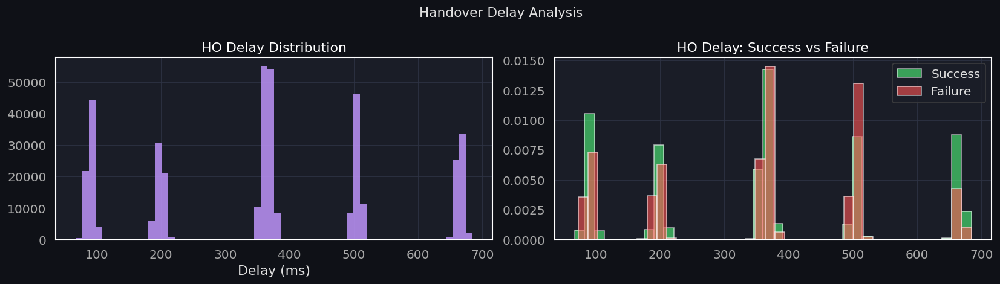

---

**H4 — Ping-pong flag and handover success are nearly redundant network-side labels**

The Feature Correlation Matrix shows ping_pong_flag and handover_success have a correlation of r=0.99, and both correlate with handover_delay at r=0.63. The Categorical Feature Distributions confirms both have near-identical split ratios (ping_pong: 56.3%/43.7%, handover_success: 55.6%/44.4%). Including both in the same model will introduce severe multicollinearity. For Task B, use handover_success as the target and exclude ping_pong_flag as a feature, or use it only as a post-hoc diagnostic label.
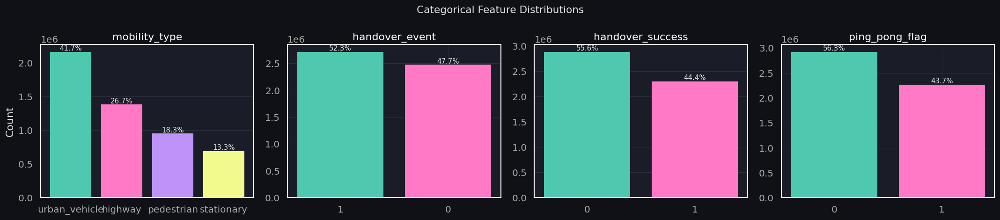

``conclusion`` : the most efficient way is to use the ping_pong flag as post-hoc diagnostic label or not use it at all.

---

**H5 — Hysteresis and time_to_trigger are network configuration parameters with weak predictive signal**

The Feature Correlation Matrix shows hysteresis and time_to_trigger have near-zero correlations with almost all features, with the only notable value being time_to_trigger correlating with handover_delay at r=0.50. These are 3GPP configuration parameters set by the network operator — in a real deployment they would be tuning knobs rather than predictive features. They should be included cautiously and monitored for feature importance — if they rank highly it is likely a simulation artifact.

``conclusion`` : they're already token as knobs rather than predictive features. knobs(des reglages)

---

**H6 — Spatial cluster membership reflects simulation zone differences, not real coverage patterns**

The geographic handover outcome maps show 4 DBSCAN clusters with failure rates ranging from 11% to 20% across different zones of Morocco (Casablanca, Rabat-Kénitra, Tanger, Marrakech). Since this is synthetic data generated from real coordinates with 3GPP norms, these failure rate differences likely reflect distinct simulation parameters assigned per geographic zone rather than genuine coverage patterns. Including cluster_id as a feature risks overfitting to simulation artifacts that will not generalize. This feature should be dropped from the model and treated instead as a stratification

 ```conclusion`` :variable for evaluation — reporting per-cluster AUC reveals whether the model generalizes across zones.
 ```note`` : weather we'll use the geographic pattern or not will be discussed later in a fully-fledged notebook 

---

**H7 — A cascade two-stage model reflects the real network decision architecture**

The Feature Correlation Matrix shows handover_event and handover_success correlate at r=0.85, confirming they are not independent targets. *The network decision process is itself sequential* — the eNB first decides whether to trigger a handover, then the outcome is determined by signaling conditions. **A two-stage cascade model mirrors this architecture: Stage 1 predicts P(HO event in next 5s) optimized for recall to minimize missed handovers, and Stage 2 predicts P(success | HO triggered) optimized for precision to minimize false failure alarms**. This design also allows independent threshold tuning per stage, which is not possible with a single multi-output model.

conclusion : even the handover_succes and handover_event have a strong correlation we can use A two-stage cascade model mirrors this architecture. the decision will be made in the experimentation phase. this decision have 4-dim parameters (complexity in real time prediction, overfitting, underfitting, training complexity).

---

## UE (Mobile Phone) Side
*(features measured and reported by the UE: rsrp, sinr, rsrq, cqi, speed, latency, jitter, throughput, packet_loss)*

---

**H8 — RSRP and SINR are redundant by construction; use CQI as the single signal quality feature**

The Feature Correlation Matrix shows RSRP and SINR correlate at r=0.99, and both correlate with CQI at r=0.96–0.97. In 3GPP systems SINR is mathematically derived from RSRP and interference estimates, making their near-perfect correlation expected by construction rather than a discovered insight. The Signal Quality: Handover vs No-Handover plot confirms all three are statistically different at HO trigger points (MW p values of 3.20e-58, 3.43e-54, 8.40e-120 respectively), but CQI shows the strongest separation (largest p-value magnitude) because it is a quantized scheduler-facing metric that directly influences transmission decisions. Use CQI as the single representative of signal quality and drop RSRP and SINR to avoid multicollinearity. 

``conclusion`` : based on data analysis the **rsrq** does not separate the handover vs no-handover the two distribution are superimposed. this is why the best indicator that resume the two parameter **rsrp and sinr** is **CQI**. but we can use PCA to compobine  **rsrp and sinr** . the best feature we'll be explored in the experimentation phase.
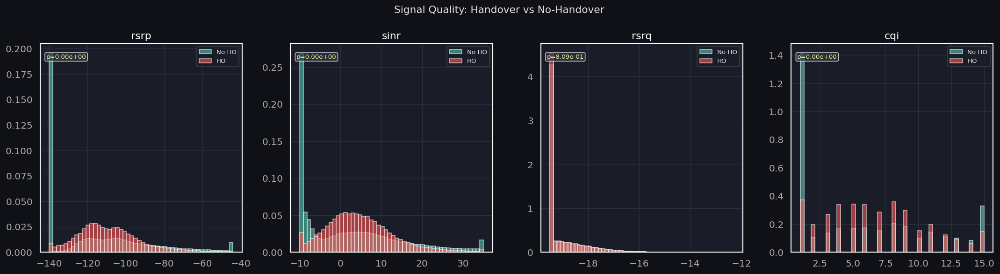


---

**H9 — Near-unit-root persistence makes first-difference features the primary input representation**

The ACF/PACF per Feature plots show completely flat non-decaying ACFs across 60 lags for all three features (RSRP ~0.85–0.90, throughput ~0.75–0.80, latency ~0.25), combined with PACFs dropping to zero after lag 1. This is not a stationary AR process but a near-unit-root process where shocks persist indefinitely and consecutive raw values are nearly identical. Raw lag features are therefore redundant inputs. First-difference features (δrsrp, δthroughput, δlatency) transform these integrated series into stationary innovations that capture actual step-to-step dynamics.

``conclusion`` : we should process the signals used as prediction features by differianciations, transformations before us any statistical model.

``note`` : NN's do that automatically. 

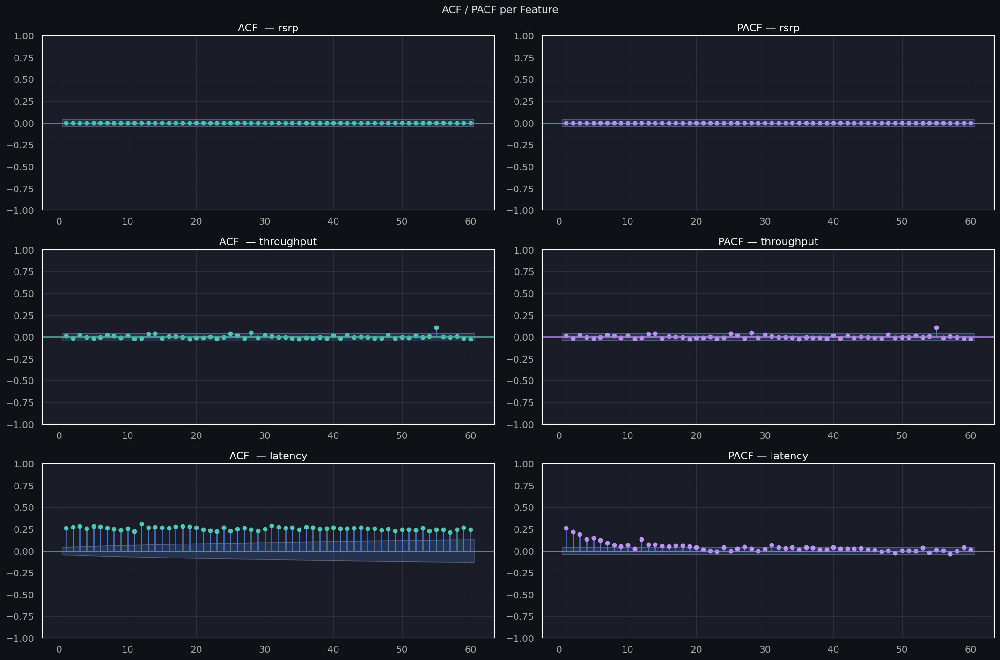

---

**H10 — No reliable pre-handover signal exists in UE measurements**

The Signal Evolution in 10s Before Handover, the Individual HO Episodes RSRP and SINR Trajectories, and the Mean RSRP Rate-of-Change Before Handover all converge on the same finding: RSRP, SINR, and throughput are completely flat up to the handover moment with delta values oscillating around zero and no directional trend. The std bands dwarf any detectable mean shift, and individual episode trajectories scatter uniformly across the full value range. There is no exploitable degradation signature in the 5-second window before a handover. A model relying solely on UE-measured features will not outperform a structural context baseline using only network-side features — Task A prediction must lean on cell_load, num_neighbor_cells, and mobility regime rather than UE signal dynamics.

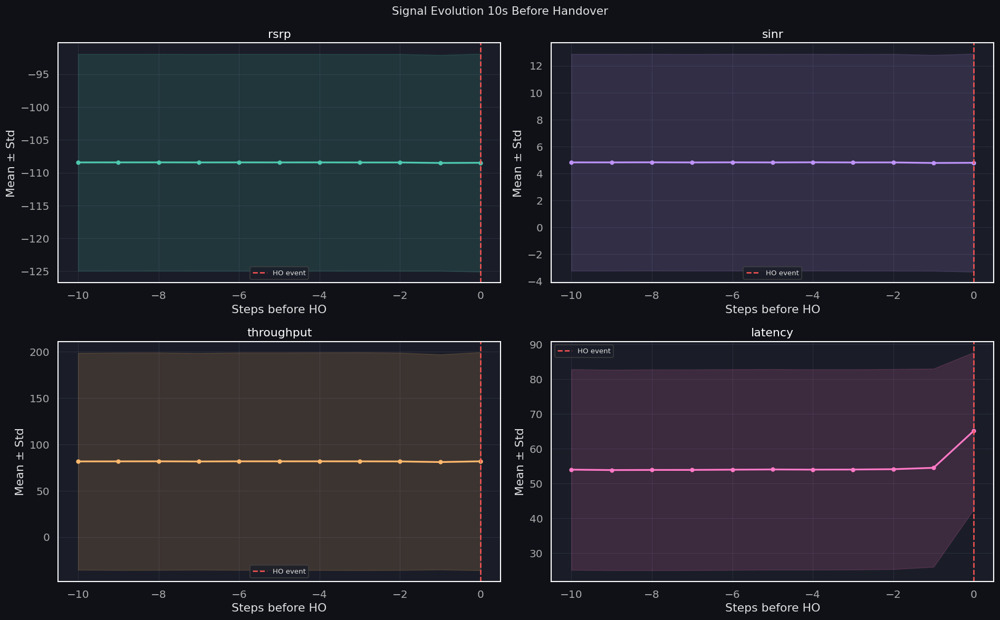
---

**H11 — All UE-measured features are non-normal and require robust preprocessing**

The Shapiro-Wilk Normality Tests show every feature fails normality (all p < 1e-20). Latency (skewness=3.73, kurtosis=16.6), jitter (skewness=4.23, kurtosis=23.1), and throughput (skewness=2.51, kurtosis=9.06) are severely right-skewed and heavy-tailed as confirmed by the Network Performance Distributions histograms. **Tree-based models handle this natively, but neural networks require log1p transformation followed by robust scaling (median/IQR rather than mean/std) for latency, jitter, throughput, and packet_loss. RSRP and SINR are bimodal rather than skewed (visible in the Signal Quality: Handover vs No-Handover plot) and should be standardized without log transformation.**

---

**H12 — Mobility type should be used for stratification only, not as a predictive feature**

The Categorical Feature Distributions shows an imbalance across mobility types (urban_vehicle 41.7%, highway 26.7%, pedestrian 18.3%, stationary 13.3%). The Scenario Radar Chart confirms the four mobility scenarios have radically different metric profiles — Scenario 4 has strong RSRP/SINR but high latency while Scenario 3 is compressed across all metrics. The presence of a stationary category that still generates handover events reveals that mobility_type encodes simulation regimes rather than genuine physical movement behavior. Using it as a predictive feature risks learning simulation-specific rules. It should instead be used exclusively as a stratification variable — training batches should be balanced across mobility types and AUC should be reported per mobility type to verify the model generalizes across regimes.

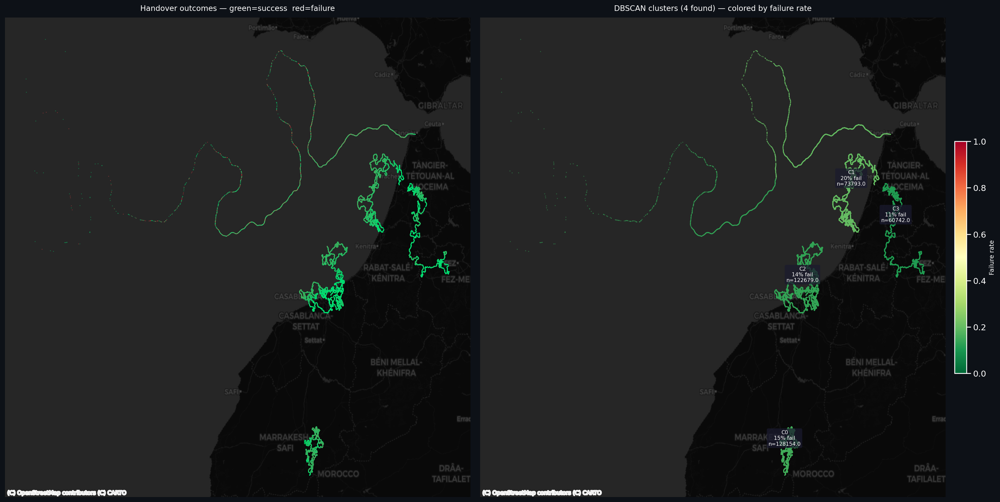
---

**H13 — Time-based train/test splitting is mandatory due to regime shift in the first 3 hours**

The 1-Minute Aggregated Trends shows a simultaneous sharp degradation across all UE-measured features between 00:00 and 03:00 — RSRP drops from ~−60 dBm to ~−100 dBm, SINR from 25 dB to ~7 dB, throughput from 180 to ~75 Mbps, and packet loss rises from near zero to ~0.08 — all stabilizing after 03:00. 
 rather than periodic behavior. Random train/test splitting would leak post-stabilization samples into training when predicting pre-stabilization periods, producing artificially inflated accuracy metrics that would not reflect real deployment performance. The first 3 hours should either be excluded entirely as a burn-in period or kept strictly in the training set with all evaluation performed on post-03:00 data.

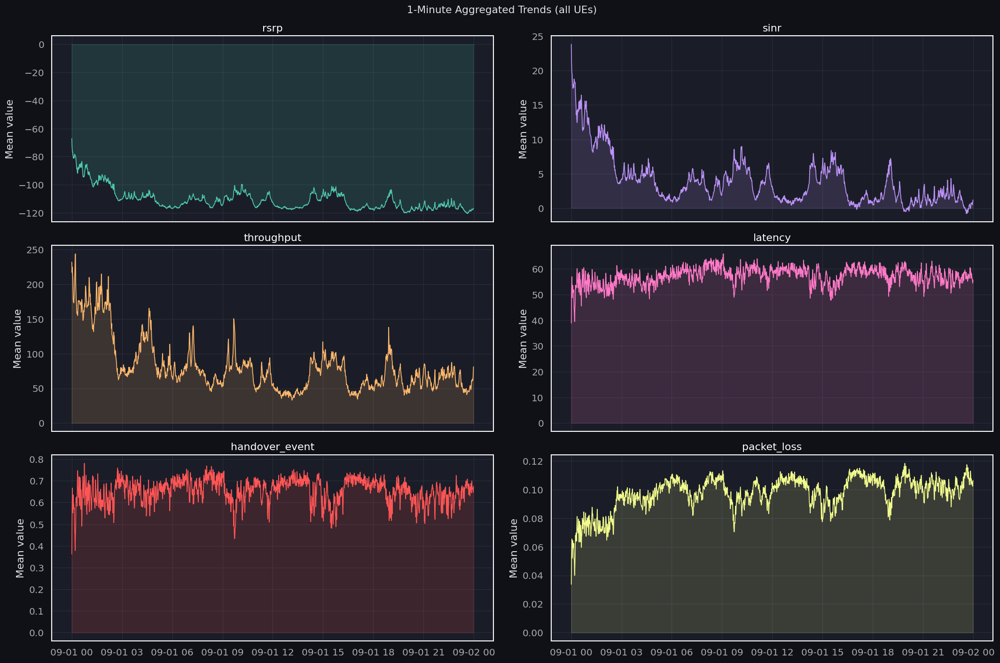

## ML Model & Approach Hypotheses

---

## Baseline Hypotheses

---

**H14 — A rule-based 3GPP A3-event replica is the mandatory baseline**

Before any ML model is evaluated, a deterministic baseline must be established that replicates the standard 3GPP A3 event trigger: handover is predicted when RSRP of the neighbor cell exceeds the serving cell RSRP by the hysteresis margin for a duration equal to time_to_trigger. This baseline is critical for two reasons. First, it defines the performance floor that any ML model must strictly exceed to justify deployment — if the ML model cannot beat the rule the network already uses, it has no practical value. Second, since the data was generated using 3GPP norms, the A3 rule may already explain a large fraction of the handover_event labels, meaning a naive ML model trained without awareness of this rule could simply rediscover it without adding genuine intelligence. AUC, F1, and false negative rate should all be reported relative to this baseline.

---

**H15 — A per-feature median predictor is the mandatory Task B baseline**

For handover success prediction, a zero-intelligence baseline that always predicts the majority class (failure, 55.6% from the Categorical Feature Distributions) must be established before any model evaluation. Given the near-balanced class distribution, this baseline will achieve ~55.6% accuracy — any model that does not significantly exceed this in AUC and F1 on the held-out time split is not learning anything beyond class prior. This baseline is particularly important because H10 established that no pre-HO signal exists in UE measurements, meaning a poorly designed model could easily collapse to majority-class prediction.

---
---

## Feature Representation Hypotheses

---

**H16 — A flat lag-feature vector fed to gradient boosting is the strongest risk-adjusted model for Task A**

Given H9 established that the temporal structure is purely AR(2–3) with no seasonality or MA components, and H10 established that no pre-HO signal exists beyond structural context, the optimal feature representation is a flat vector combining current + 2–3 lag values of CQI, throughput, and latency alongside static structural features (cell_load, num_neighbor_cells, hysteresis, time_to_trigger). XGBoost or LightGBM fed this vector offers three advantages over sequence models in this specific context: it handles the non-normal distributions natively without preprocessing (H11), it provides built-in feature importance that can be interpreted against the network/UE side split established in the detection-side analysis, and it trains and tunes in a fraction of the time of an LSTM. An LSTM or GRU should only be pursued if this flat-vector gradient boosting model demonstrably underperforms on the time-based evaluation split.

---

**H17 — A Temporal Convolutional Network is the preferred sequence model if deep learning is required**

If the flat-vector gradient boosting model (H16) is insufficient, a TCN is preferable to an LSTM or GRU for this dataset for three specific reasons grounded in the data analysis. First, H9 showed that the relevant temporal structure decays within 2–4 lags — TCN dilated convolutions capture fixed-range dependencies more efficiently than LSTM hidden states which accumulate unnecessary long-range memory. Second, the Individual HO Episodes RSRP and SINR Trajectories showed that individual episode trajectories are extremely noisy — LSTM gates are sensitive to this noise during backpropagation through time, while TCN convolutions average over the window more robustly. Third, TCNs train in parallel across time steps while LSTMs are inherently sequential, making TCNs significantly faster to iterate on with the large dataset size implied by the 300,000 HO event cap in the preprocessing code.

---

**H18 — Delta features and rate-of-change engineered inputs will dominate raw values in feature importance**

The Mean RSRP Rate-of-Change Before Handover shows oscillating delta values with no trend, and the Signal Evolution in 10s Before Handover shows flat raw means. However, the variance of these delta values is itself informative — high volatility in RSRP rate-of-change in the steps before HO may be a stronger signal than the direction of change. Concretely, the following engineered features should be constructed and their importance monitored: δCQI/δt (1-step difference), rolling standard deviation of RSRP over 3 steps, rolling standard deviation of latency over 3 steps, and the ratio of current cell_load to its 3-step rolling mean. These volatility-based features capture instability rather than trend, which is more consistent with what the pre-HO analysis actually shows — not a clean degradation slope but an increase in signal instability.

---
---

## Model Architecture Hypotheses

---

**H19 — The two-stage cascade should share a common trunk with two separate output heads**

Building on H7, the two-stage cascade is best implemented not as two completely independent models but as a shared-trunk architecture where a common feature extractor feeds two separate classification heads. The rationale is that Task A (HO event prediction) and Task B (HO success prediction) share the same input features and the Feature Correlation Matrix shows their targets correlate at r=0.85 — meaning the intermediate representations learned for Task A are partially transferable to Task B. A shared trunk reduces total parameter count, enforces consistent feature preprocessing, and allows joint training with a weighted loss (λ·L_TaskA + (1−λ)·L_TaskB) where λ is tuned on the validation split. If gradient boosting is used instead of a neural network, this translates to training a single model with a multi-output objective or using Task A predictions as an input feature to Task B.

---

**H20 — Class imbalance must be addressed differently for Task A and Task B**

The Categorical Feature Distributions shows Task A is near-balanced (52.3% HO vs 47.7% no-HO) while Task B has a 55.6%/44.4% failure/success split. For Task A the near-balance means standard cross-entropy loss is appropriate with no resampling needed, but the decision threshold should be tuned toward recall since a missed handover prediction (false negative) is more costly operationally than a false alarm. For Task B the slight imbalance combined with H10's finding that no strong pre-HO signal exists means the model is at risk of collapsing to majority-class prediction under standard loss — focal loss or class-weighted cross-entropy should be applied, and the primary evaluation metric should be AUC-ROC rather than accuracy since accuracy will be misleadingly high even for a near-trivial model.

---
---

## Evaluation Hypotheses

---

**H21 — Per-mobility-type AUC must be reported to detect simulation regime overfitting**

Building on H12, a single aggregate AUC score on the held-out test set is insufficient to validate the model. Since the Scenario Radar Chart shows the four mobility scenarios have radically different metric profiles and the Categorical Feature Distributions shows urban_vehicle dominates at 41.7%, a model that achieves good aggregate AUC may be performing well only on urban_vehicle samples while failing on stationary and pedestrian scenarios. Per-mobility-type AUC, F1, and false negative rate should be reported separately, and the model should be considered valid only if performance is acceptable across all four types — not just in aggregate.

---

**H22 — Calibration must be evaluated alongside discrimination**

Both tasks produce probability outputs (P(HO in 5s) and P(success | HO)) that will be used as operational thresholds by the network. A model with high AUC but poor calibration — meaning its predicted probabilities do not reflect true empirical frequencies — is dangerous in a network context because threshold-based decisions will be systematically biased. Reliability diagrams (predicted probability vs observed frequency across bins) and Expected Calibration Error should be reported alongside AUC. Given H11 showed all features are non-normal and H13 showed a regime shift in the first 3 hours, calibration should be evaluated separately on the post-03:00 stabilized period to avoid the initialization transient distorting the calibration curve. If calibration is poor, Platt scaling or isotonic regression should be applied as a post-processing step before deployment.